In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import healpy as hp
from rubin_sim.data import get_baseline, get_data_dir
import rubin_sim.maf as maf

In [2]:
opsdb_file = get_baseline()
runName = os.path.split(opsdb_file)[-1].replace('.db', '')
print(runName)

baseline_v2.0_10yrs


In [3]:
# Demo the map 
# (not necessary for use with just the metrics - see below. This is just to demonstrate the slicepoint info)

cols = ['fieldRA', 'fieldDec', 'filter', 'observationStartMJD', 'visitExposureTime', 'fiveSigmaDepth', 'rotSkyPos']
simdata = maf.getSimData(opsdb_file, 'night <= 365*2', cols)
simdata[0:10]

rec.array([(310.0244801 , -60.81292802, 'y', 60218.00180556, 30., 22.3705568 , 62.75077469),
           (310.60187065, -63.56142457, 'y', 60218.00225414, 30., 22.33832685, 61.08425006),
           (311.2926113 , -66.31777378, 'y', 60218.00270279, 30., 22.29548686, 60.72618943),
           (312.1407313 , -69.08266621, 'y', 60218.00315152, 30., 21.27042123, 60.65678092),
           (304.17016259, -73.37544181, 'y', 60218.00362374, 30., 21.20527555, 49.09553663),
           (304.26955796, -70.56522163, 'y', 60218.00407267, 30., 21.26477096, 49.29742126),
           (310.0244801 , -60.81292802, 'y', 60218.00495938, 30., 21.40744224, 60.11341545),
           (310.60187065, -63.56142457, 'y', 60218.00540803, 30., 21.37457286, 59.34346652),
           (311.2926113 , -66.31777378, 'y', 60218.00585674, 30., 21.45500171, 59.0939424 ),
           (312.1407313 , -69.08266621, 'y', 60218.00630551, 30., 21.40615147, 59.1181414 )],
          dtype=[('fieldRA', '<f8'), ('fieldDec', '<f8'), ('filter', 

In [4]:
slicer = maf.HealpixSlicer(nside=64)
slicer.setupSlicer(simdata)
print(f'original slicepoint keys are {slicer.slicePoints.keys()}')

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes
original slicepoint keys are dict_keys(['sid', 'ra', 'dec', 'nside', 'gall', 'galb'])


In [5]:
galmap = maf.GalacticPlanePriorityMap()
sp = galmap.run(slicer.slicePoints)

Read galplane priority map from /Users/lynnej/rubin_sim_data/maps/GalacticPlanePriorityMaps/priority_galPlane_footprint_map_data_u.fits
Read galplane priority map from /Users/lynnej/rubin_sim_data/maps/GalacticPlanePriorityMaps/priority_galPlane_footprint_map_data_g.fits
Read galplane priority map from /Users/lynnej/rubin_sim_data/maps/GalacticPlanePriorityMaps/priority_galPlane_footprint_map_data_r.fits
Read galplane priority map from /Users/lynnej/rubin_sim_data/maps/GalacticPlanePriorityMaps/priority_galPlane_footprint_map_data_i.fits
Read galplane priority map from /Users/lynnej/rubin_sim_data/maps/GalacticPlanePriorityMaps/priority_galPlane_footprint_map_data_z.fits
Read galplane priority map from /Users/lynnej/rubin_sim_data/maps/GalacticPlanePriorityMaps/priority_galPlane_footprint_map_data_y.fits
Read galplane priority map from /Users/lynnej/rubin_sim_data/maps/GalacticPlanePriorityMaps/priority_galPlane_footprint_map_data_sum.fits


In [6]:
# We have to make a slicePoint key for each galactic plane map component .. 
print(f'new slicepoint keys are {sp.keys()}')

new slicepoint keys are dict_keys(['sid', 'ra', 'dec', 'nside', 'gall', 'galb', 'galplane_priority_zucker_sfr_map:u', 'galplane_priority_open_clusters_map:u', 'galplane_priority_galactic_plane_map:u', 'galplane_priority_xray_binaries_map:u', 'galplane_priority_clementini_stellarpops_map:u', 'galplane_priority_globular_clusters_map:u', 'galplane_priority_pencilbeams_map:u', 'galplane_priority_magellenic_clouds_map:u', 'galplane_priority_bonito_sfr_map:u', 'galplane_priority_combined_map:u', 'galplane_priority_galactic_bulge_map:u', 'galplane_priority_zucker_sfr_map:g', 'galplane_priority_open_clusters_map:g', 'galplane_priority_galactic_plane_map:g', 'galplane_priority_xray_binaries_map:g', 'galplane_priority_clementini_stellarpops_map:g', 'galplane_priority_globular_clusters_map:g', 'galplane_priority_pencilbeams_map:g', 'galplane_priority_magellenic_clouds_map:g', 'galplane_priority_bonito_sfr_map:g', 'galplane_priority_combined_map:g', 'galplane_priority_galactic_bulge_map:g', 'galpl

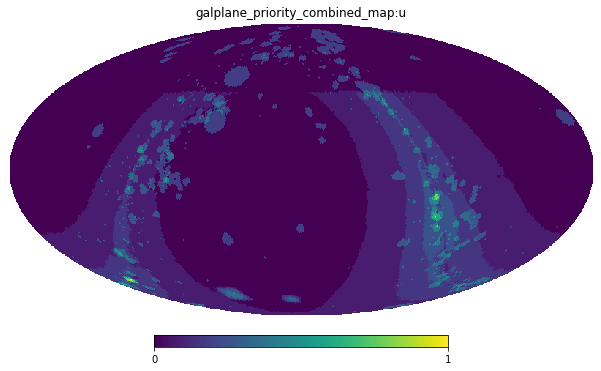

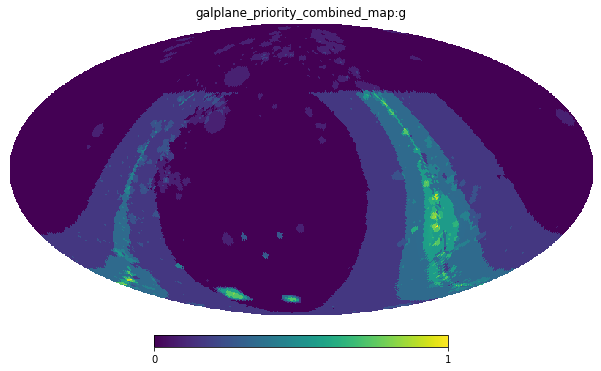

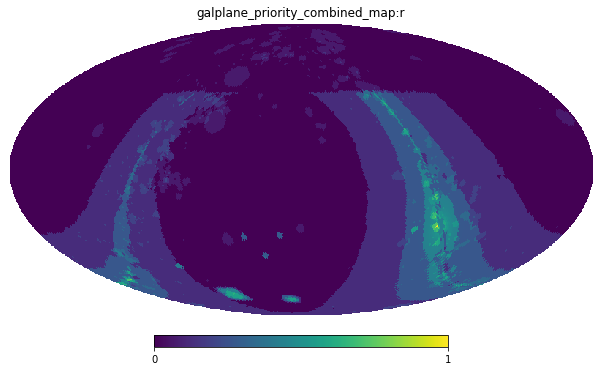

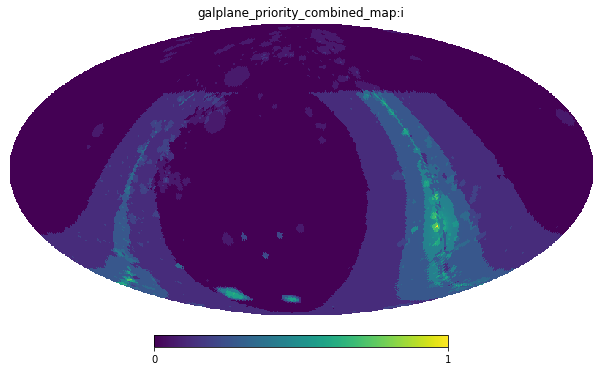

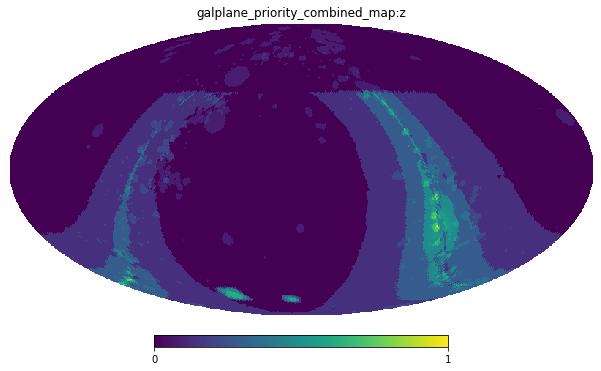

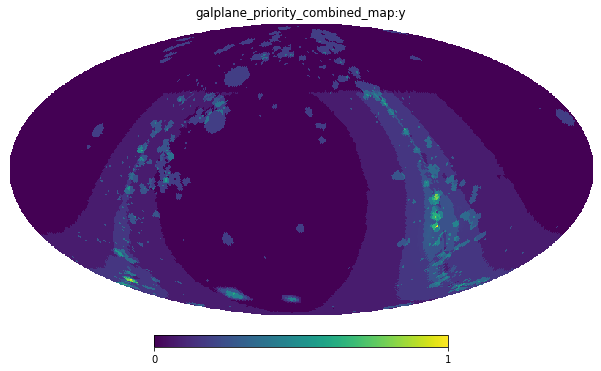

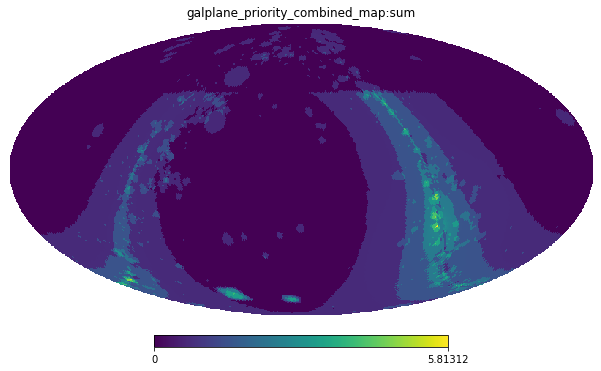

In [7]:
for key in [k for k in sp.keys() if 'galplane_priority' in k and 'combined' in k]:
    hp.mollview(sp[key], min=0, title=key)

In [8]:
# Okay and let's check a thing -- we've got these maps bundled up. 
# Does the slicepoint really access the correct point?
# Pick a point in the plane
idx = maf.radec2pix(ra=np.radians(250), dec=np.radians(-40), nside=64)
print(idx)
slicer[idx]['slicePoint']

40497


{'sid': 40497,
 'ra': 4.356505437595221,
 'dec': -0.7021142756051657,
 'nside': 64,
 'gall': 5.982230859344304,
 'galb': 0.0781489930402135,
 'galplane_priority_zucker_sfr_map:u': 0.0,
 'galplane_priority_open_clusters_map:u': 0.0,
 'galplane_priority_galactic_plane_map:u': 0.135,
 'galplane_priority_xray_binaries_map:u': 2.7729018e-05,
 'galplane_priority_clementini_stellarpops_map:u': 0.0,
 'galplane_priority_globular_clusters_map:u': 0.0,
 'galplane_priority_pencilbeams_map:u': 0.0,
 'galplane_priority_magellenic_clouds_map:u': 0.0,
 'galplane_priority_bonito_sfr_map:u': 0.0,
 'galplane_priority_combined_map:u': 0.25237477,
 'galplane_priority_galactic_bulge_map:u': 0.0,
 'galplane_priority_zucker_sfr_map:g': 0.0,
 'galplane_priority_open_clusters_map:g': 0.0,
 'galplane_priority_galactic_plane_map:g': 0.6075,
 'galplane_priority_xray_binaries_map:g': 0.00055890554,
 'galplane_priority_clementini_stellarpops_map:g': 0.0,
 'galplane_priority_globular_clusters_map:g': 0.0,
 'galplane_

In [9]:
# Okay, let's move along to the metrics themselves

footprint_summaries = [maf.SumMetric()]
footprint_plotdicts = {'percentileClip': 95}
filter_summaries = [maf.MeanMetric(), maf.MedianMetric(), maf.RmsMetric(),
                   maf.AreaThresholdMetric(lower_threshold=0.8)]
filter_plotdicts = {'colorMin': 0, 'colorMax': 2, 'xMin': 0, 'xMax': 5}
timescale_summaries = [maf.SumMetric(), maf.MedianMetric(), 
                       maf.AreaThresholdMetric(lower_threshold=0.5)]
timescale_plotdicts = {'colorMin': 0, 'colorMax': 1, 'xMin': 0, 'xMax': 1}

science_maps = [s.replace('galplane_priority_', '').split(":")[0] for s in galmap.keynames if 'sum' in s]

slicer = maf.HealpixSlicer(nside=64, useCache=False)
sql = None
bundles = {}
for m in science_maps:
    footprintmetric = maf.GalPlaneFootprintMetric(science_map = m)
    bundles[f'{m} footprint'] = maf.MetricBundle(footprintmetric, slicer, sql,
                                                 plotDict=footprint_plotdicts,
                                                 runName=runName, summaryMetrics=footprint_summaries)
    filtermetric = maf.GalPlaneTimePerFilterMetric(science_map = m)
    bundles[f'{m} filter'] = maf.MetricBundle(filtermetric, slicer, sql,
                                              plotDict=filter_plotdicts,
                                              runName=runName, summaryMetrics=filter_summaries)
    visit_timescalesmetric = maf.GalPlaneVisitIntervalsTimescaleMetric(science_map=m)
    bundles[f'{m} visit intervals'] = maf.MetricBundle(visit_timescalesmetric, slicer, sql,
                                                       plotDict=timescale_plotdicts,
                                                       runName=runName, summaryMetrics=timescale_summaries)
    season_timescalemetric = maf.GalPlaneSeasonGapsTimescaleMetric(science_map=m)
    bundles[f'{m} season gaps'] = maf.MetricBundle(season_timescalemetric, slicer, sql,
                                                   plotDict=timescale_plotdicts,
                                                   runName=runName, summaryMetrics=timescale_summaries)

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes


In [10]:
!/bin/rm galplane_test/*
outDir = 'galplane_baseline_v2.0_10yrs'
resultsDb = maf.ResultsDb(outDir)
g = maf.MetricBundleGroup(bundles, opsdb_file, outDir=outDir, resultsDb=resultsDb)
g.runAll()

zsh:1: no matches found: galplane_test/*
Querying table None with no constraint for columns ['filter', 'fieldDec', 'visitExposureTime', 'observationStartMJD', 'fieldRA', 'fiveSigmaDepth', 'rotSkyPos'].
Found 2086980 visits
Running:  ['zucker_sfr_map footprint', 'zucker_sfr_map filter', 'zucker_sfr_map visit intervals', 'zucker_sfr_map season gaps', 'open_clusters_map footprint', 'open_clusters_map filter', 'open_clusters_map visit intervals', 'open_clusters_map season gaps', 'galactic_plane_map footprint', 'galactic_plane_map filter', 'galactic_plane_map visit intervals', 'galactic_plane_map season gaps', 'xray_binaries_map footprint', 'xray_binaries_map filter', 'xray_binaries_map visit intervals', 'xray_binaries_map season gaps', 'clementini_stellarpops_map footprint', 'clementini_stellarpops_map filter', 'clementini_stellarpops_map visit intervals', 'clementini_stellarpops_map season gaps', 'globular_clusters_map footprint', 'globular_clusters_map filter', 'globular_clusters_map vis

In [11]:
# Note that the 'reduce' function output is available in the bundles dictionary .. we have lots of keys now!
len(list(bundles.keys()))

330

In [12]:
# Plot to the output directory
g.plotAll()

/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/plotHandler.py:583: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn(
0.0 180.0 -180.0 180.0


Plotting figures with "" constraint now.


0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:468: UserWarning: Histogram range was single-valued; expanding default range.
  warnings.warn("Histogram range was single-valued; expanding default range.")
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:115: RuntimeWarning: invalid value encountered in double_scalars
  nbins = (binmax - binmin) / binwidth
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:129: UserWarning: Optimal bin calculation calculated NaN: returning 200
  warnings.warn(
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:567: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  plt.xlim(right=plotDict["xMax"])
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/

0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:468: UserWarning: Histogram range was single-valued; expanding default range.
  warnings.warn("Histogram range was single-valued; expanding default range.")
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:115: RuntimeWarning: divide by zero encountered in double_scalars
  nbins = (binmax - binmin) / binwidth
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:117: UserWarning: Optimal bin calculation tried to make inf bins, returning 200
  warnings.warn(
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:567: UserWarning: Attempting to set identical left == right == 0.0 results in singular transformations; automatically expanding.
  plt.xlim(right=plotDict["xMax"])
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin

0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:117: UserWarning: Optimal bin calculation tried to make 289 bins, returning 200
  warnings.warn(
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:117: UserWarning: Optimal bin calculation tried to make 1250 bins, returning 200
  warnings.warn(
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:115: RuntimeWarning: divide by zero encountered in double_scalars
  nbins = (binmax - binmin) / binwidth
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:117: UserWarning: Optimal bin calculation tried to make inf bins, returning 200
  warnings.warn(
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:468: UserWarning: Histogram range was single-valued; expandi

0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:468: UserWarning: Histogram range was single-valued; expanding default range.
  warnings.warn("Histogram range was single-valued; expanding default range.")
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:115: RuntimeWarning: invalid value encountered in double_scalars
  nbins = (binmax - binmin) / binwidth
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:129: UserWarning: Optimal bin calculation calculated NaN: returning 200
  warnings.warn(
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:567: UserWarning: Attempting to set identical left == right == 58.00000086426735 results in singular transformations; automatically expanding.
  plt.xlim(right=plotDict["xMax"])
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:468: UserWarning: Histogram ra

0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:115: RuntimeWarning: invalid value encountered in double_scalars
  nbins = (binmax - binmin) / binwidth
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:129: UserWarning: Optimal bin calculation calculated NaN: returning 200
  warnings.warn(
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:115: RuntimeWarning: invalid value encountered in double_scalars
  nbins = (binmax - binmin) / binwidth
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:129: UserWarning: Optimal bin calculation calculated NaN: returning 200
  warnings.warn(
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:115: RuntimeWarning: invalid value encountered in double_scalars
  nbins = (binmax - binmin) / binwidth
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/maf

0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:115: RuntimeWarning: divide by zero encountered in double_scalars
  nbins = (binmax - binmin) / binwidth
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:117: UserWarning: Optimal bin calculation tried to make inf bins, returning 200
  warnings.warn(
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:468: UserWarning: Histogram range was single-valued; expanding default range.
  war

0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:468: UserWarning: Histogram range was single-valued; expanding default range.
  warnings.warn("Histogram range was single-valued; expanding default range.")
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:115: RuntimeWarning: invalid value encountered in double_scalars
  nbins = (binmax - binmin) / binwidth
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:129: UserWarning: Optimal bin calculation calculated NaN: returning 200
  warnings.warn(
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:567: UserWarning: Attempting to set identical left == right == 0.6000000238418579 results in singular transformations; automatically expanding.
  plt.xlim(right=plotDict["xMax"])
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:468: UserWarning: Histogram r

0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:468: UserWarning: Histogram range was single-valued; expanding default range.
  warnings.warn("Histogram range was single-valued; expanding default range.")
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:115: RuntimeWarning: invalid value encountered in double_scalars
  nbins = (binmax - binmin) / binwidth
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/utils/mafUtils.py:129: UserWarning: Optimal bin calculation calculated NaN: returning 200
  warnings.warn(
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:567: UserWarning: Attempting to set identical left == right == 1.2999999523162842 results in singular transformations; automatically expanding.
  plt.xlim(right=plotDict["xMax"])
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:468: UserWarning: Histogram r

Plotting complete.


/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/plotHandler.py:583: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn(
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:186: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(

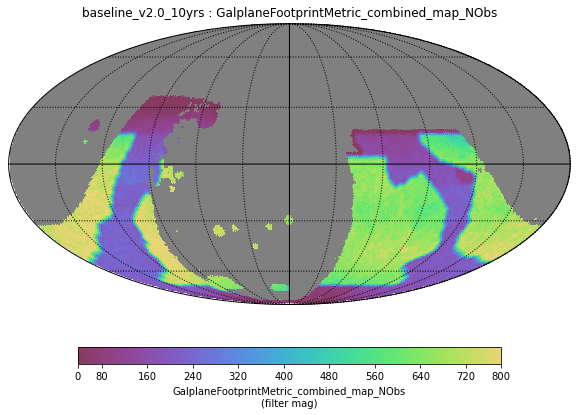

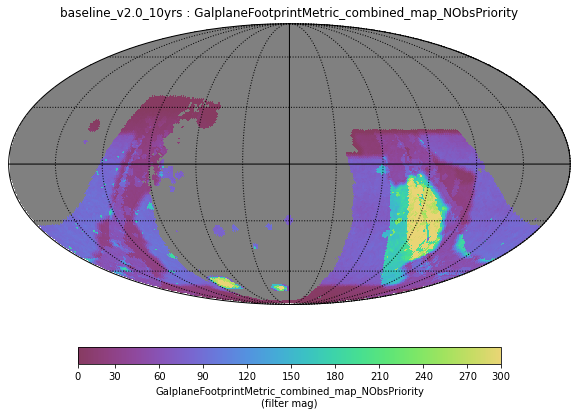

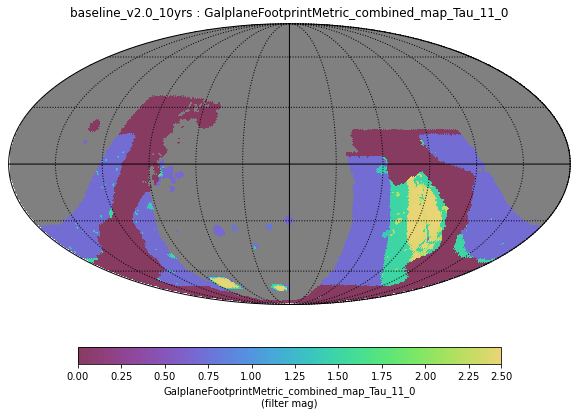

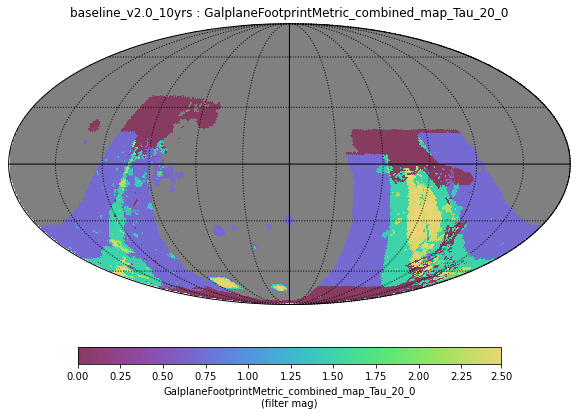

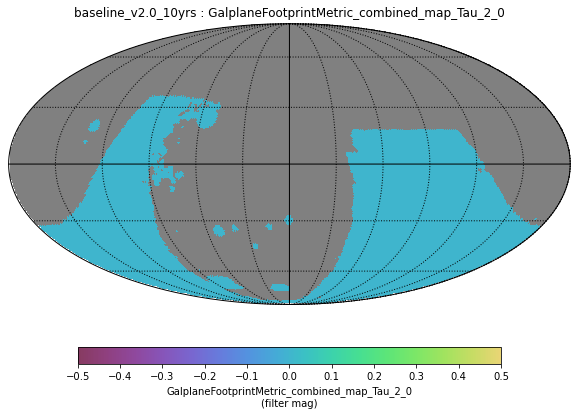

...

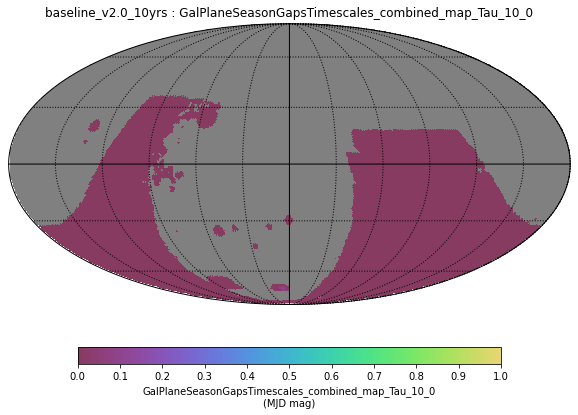

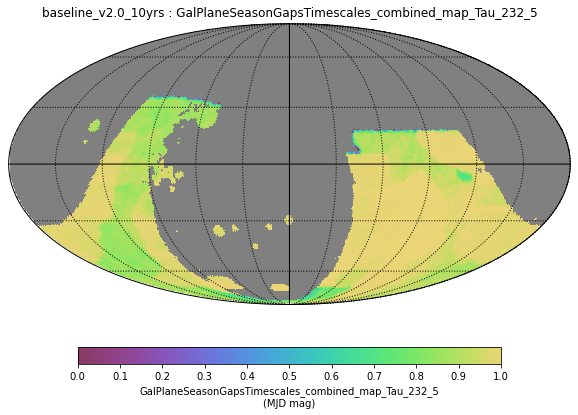

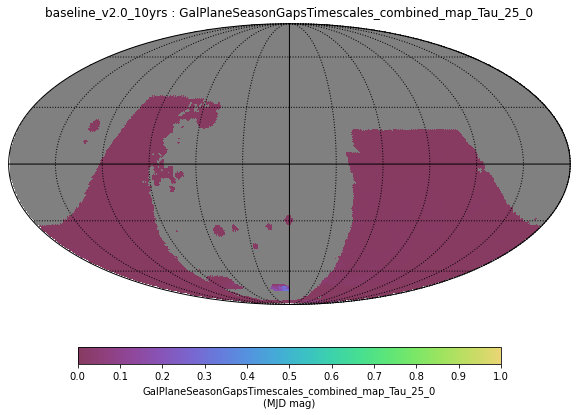

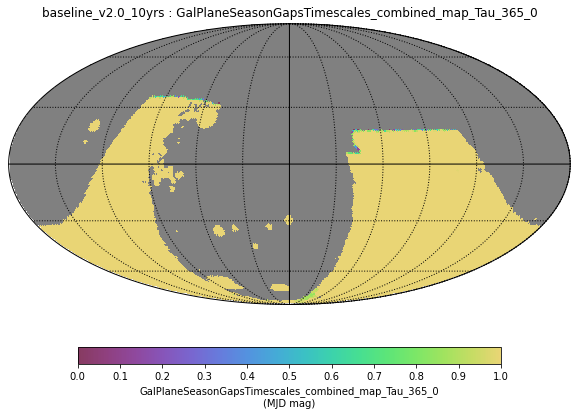

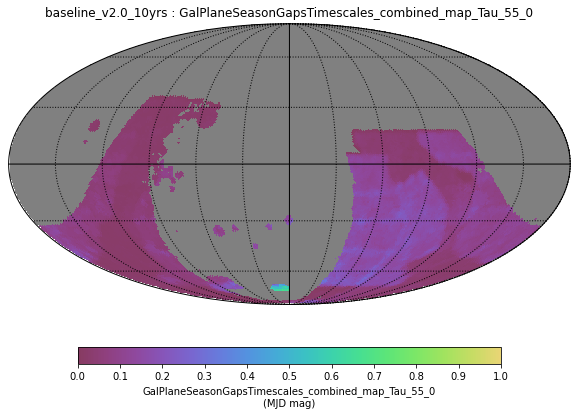

In [13]:
plots = [p for p in bundles.keys() if 'combined_map' in p]
for p in plots:
    plotDict = {'figsize': (8, 6)}
    bundles[p].setPlotDict(plotDict)
    bundles[p].plot(plotFunc=maf.HealpixSkyMap())

/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/plotHandler.py:583: UserWarning: Cannot plot object metric values with this plotter.
  warnings.warn(
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
0.0 180.0 -180.0 180.0
/Users/lynnej/other_repos/rachel_rubin_sim/rubin_sim/maf/plots/spatialPlotters.py:186: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(

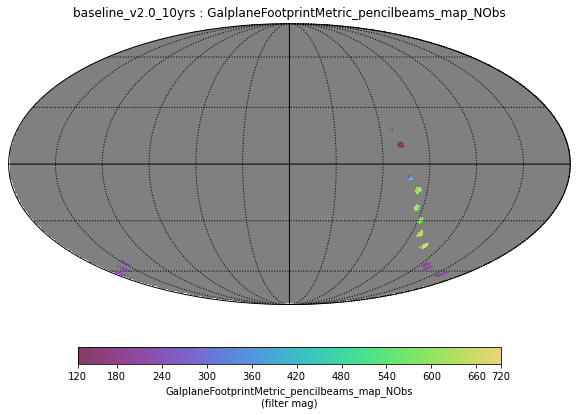

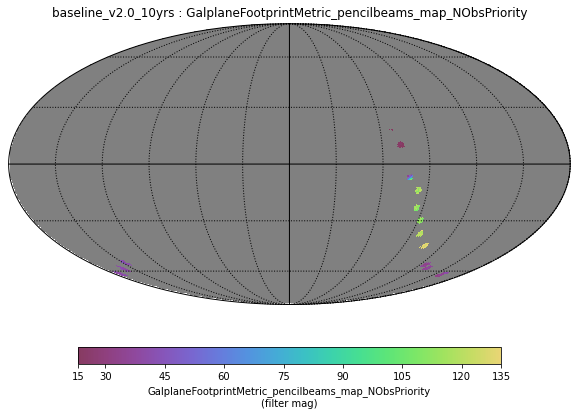

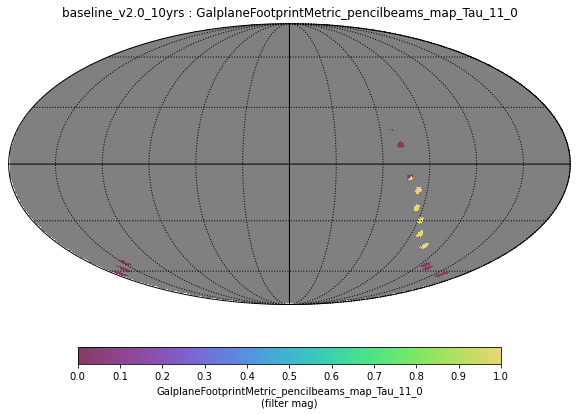

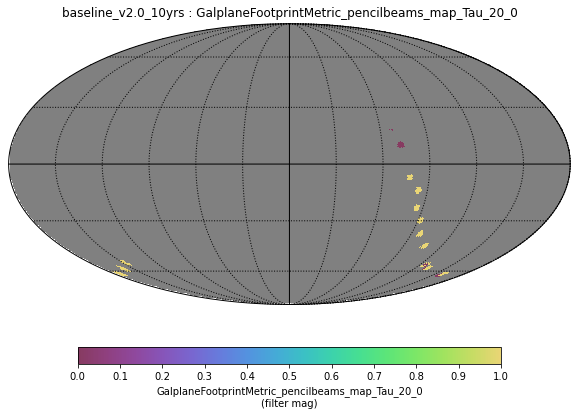

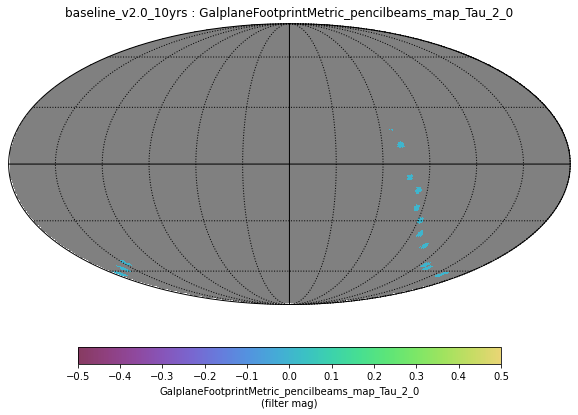

...

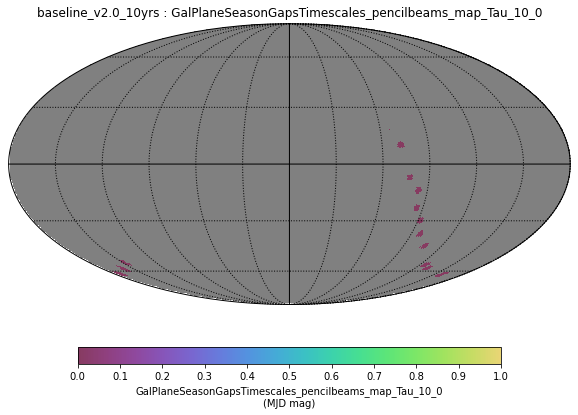

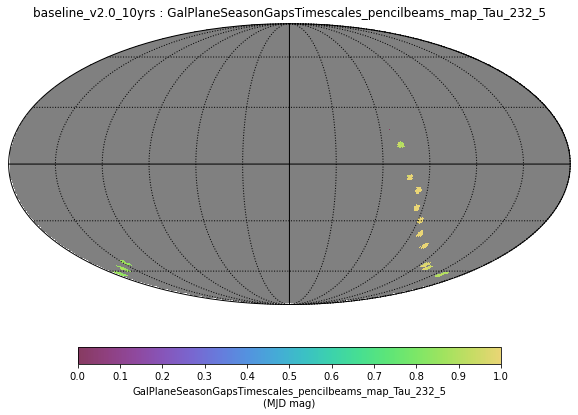

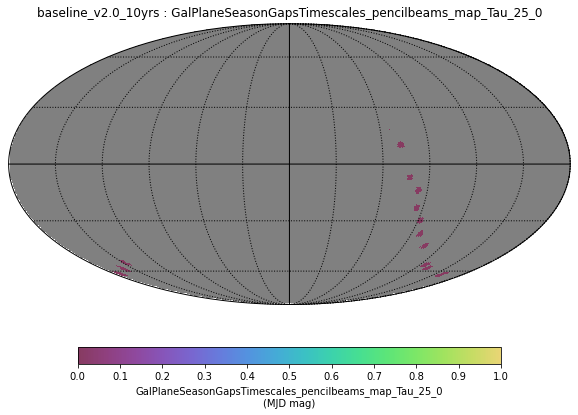

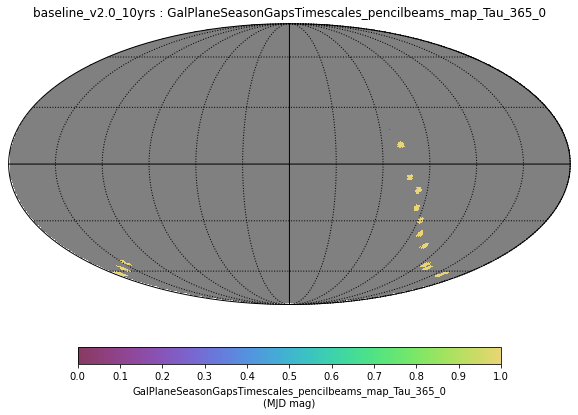

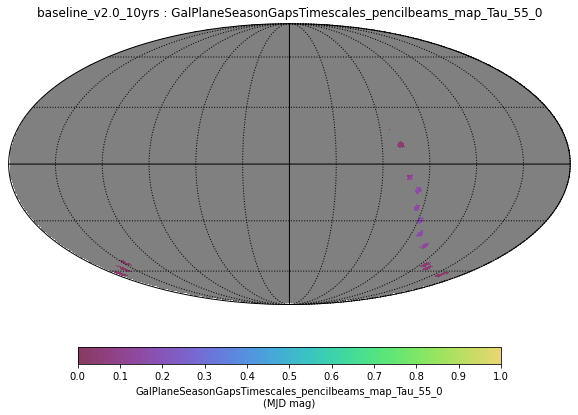

In [14]:
plots = [p for p in bundles.keys() if 'pencilbeams_map' in p]
for p in plots:
    plotDict = {'figsize': (8, 6)}
    bundles[p].setPlotDict(plotDict)
    bundles[p].plot(plotFunc=maf.HealpixSkyMap())

In [15]:
rc = maf.RunComparison(runDirs=[outDir])
mdict = rc.buildMetricDict()
rc.addSummaryStats(mdict)

In [16]:
pd.set_option("display.max_rows", None)
rc.summaryStats.T

run_name,baseline_v2.0_10yrs
metric,
Sum GalplaneFootprintMetric_zucker_sfr_map_NObs HealpixSlicer,3.822190e+05
Sum GalplaneFootprintMetric_zucker_sfr_map_NObsPriority HealpixSlicer,3.822190e+04
Sum GalplaneFootprintMetric_zucker_sfr_map_Tau_11_0 HealpixSlicer,1.968000e+02
Sum GalplaneFootprintMetric_zucker_sfr_map_Tau_20_0 HealpixSlicer,4.896000e+02
Sum GalplaneFootprintMetric_zucker_sfr_map_Tau_2_0 HealpixSlicer,0.000000e+00
Sum GalplaneFootprintMetric_zucker_sfr_map_Tau_46_5 HealpixSlicer,6.858000e+02
Sum GalplaneFootprintMetric_zucker_sfr_map_Tau_5_0 HealpixSlicer,6.000000e-01
Sum GalplaneFootprintMetric_zucker_sfr_map_Tau_73_0 HealpixSlicer,7.134000e+02
AreaThreshold GalplaneTimePerFilter_zucker_sfr_map_g HealpixSlicer,8.250257e+02


In [17]:
# Read in the summary stats from some other directories of interest (with the same contents)
dirs = [d for d in os.listdir('.') if 'galplane' in d]

rc = maf.RunComparison(runDirs=dirs)
rc.addSummaryStats()
rc.summaryStats.T[0:10]

run_name,vary_gp_gpfrac0.35_v2.0_10yrs,vary_gp_gpfrac0.30_v2.0_10yrs,vary_gp_gpfrac0.55_v2.0_10yrs,vary_gp_gpfrac0.05_v2.0_10yrs,vary_gp_gpfrac0.50_v2.0_10yrs,vary_gp_gpfrac0.75_v2.0_10yrs,vary_gp_gpfrac0.20_v2.0_10yrs,vary_gp_gpfrac1.00_v2.0_10yrs,vary_gp_gpfrac0.25_v2.0_10yrs,vary_gp_gpfrac0.40_v2.0_10yrs,vary_gp_gpfrac0.15_v2.0_10yrs,vary_gp_gpfrac0.01_v2.0_10yrs,baseline_v2.0_10yrs,vary_gp_gpfrac0.45_v2.0_10yrs,vary_gp_gpfrac0.10_v2.0_10yrs
metric,,,,,,,,,,,,,,,
Sum GalplaneFootprintMetric_galactic_plane_map_NObs HealpixSlicer,7.164992e+06,7.084382e+06,7.499869e+06,6.798911e+06,7.394392e+06,7.806061e+06,6.941043e+06,8.218269e+06,6.999656e+06,7.234527e+06,6.874147e+06,6.778963e+06,7.009576e+06,7.287527e+06,6.784287e+06
Sum GalplaneFootprintMetric_galactic_plane_map_NObsPriority HealpixSlicer,1.462798e+06,1.437316e+06,1.584993e+06,1.341243e+06,1.550053e+06,1.689983e+06,1.384959e+06,1.817148e+06,1.413688e+06,1.494134e+06,1.368993e+06,1.324615e+06,1.416063e+06,1.517830e+06,1.337230e+06
Sum GalplaneFootprintMetric_galactic_plane_map_Tau_11_0 HealpixSlicer,9.778900e+03,9.769600e+03,1.276080e+04,9.685300e+03,1.133650e+04,1.574300e+04,9.696800e+03,1.631890e+04,9.737400e+03,9.853600e+03,9.706900e+03,9.673200e+03,9.734900e+03,1.006580e+04,9.682500e+03
Sum GalplaneFootprintMetric_galactic_plane_map_Tau_20_0 HealpixSlicer,1.575220e+04,1.500940e+04,1.654550e+04,1.092640e+04,1.650550e+04,1.663300e+04,1.139910e+04,1.669150e+04,1.357860e+04,1.607190e+04,1.107450e+04,1.087560e+04,1.400580e+04,1.643650e+04,1.094580e+04
Sum GalplaneFootprintMetric_galactic_plane_map_Tau_2_0 HealpixSlicer,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
Sum GalplaneFootprintMetric_galactic_plane_map_Tau_46_5 HealpixSlicer,1.706860e+04,1.710230e+04,1.709810e+04,1.591990e+04,1.711370e+04,1.709770e+04,1.687970e+04,1.705090e+04,1.702530e+04,1.709440e+04,1.684600e+04,1.589580e+04,1.703630e+04,1.710970e+04,1.610250e+04
Sum GalplaneFootprintMetric_galactic_plane_map_Tau_5_0 HealpixSlicer,1.776000e+02,1.960000e+02,9.600000e+00,5.191000e+02,8.800000e+00,0.000000e+00,3.569000e+02,0.000000e+00,2.232000e+02,8.400000e+01,4.537000e+02,6.100000e+02,2.112000e+02,2.080000e+01,5.689000e+02
Sum GalplaneFootprintMetric_galactic_plane_map_Tau_73_0 HealpixSlicer,1.740700e+04,1.741220e+04,1.743900e+04,1.673660e+04,1.745170e+04,1.739590e+04,1.731710e+04,1.740040e+04,1.737330e+04,1.741460e+04,1.731160e+04,1.637730e+04,1.736560e+04,1.743500e+04,1.728690e+04
Mean GalplaneTimePerFilter_galactic_plane_map_g HealpixSlicer,5.988670e-01,5.941497e-01,6.289469e-01,5.408201e-01,6.180108e-01,6.448236e-01,5.691137e-01,6.629006e-01,5.847753e-01,6.100953e-01,5.478039e-01,5.202529e-01,5.913243e-01,6.231207e-01,5.464407e-01


In [18]:
rc.summaryStats.to_csv('galactic_plane_summary_stats.csv')

In [19]:
# Use some of the tools in the maf.RunComparison module to help compare outputs from these multiple runs
family_runs = maf.archive.get_family_runs()
# family_runs.loc['vary_gp']
these_runs = list(family_runs.loc['vary_gp'].run.values)
these_runs += ['baseline_v2.0_10yrs']
these_runs

['vary_gp_gpfrac0.01_v2.0_10yrs',
 'vary_gp_gpfrac0.05_v2.0_10yrs',
 'vary_gp_gpfrac0.10_v2.0_10yrs',
 'vary_gp_gpfrac0.15_v2.0_10yrs',
 'vary_gp_gpfrac0.20_v2.0_10yrs',
 'vary_gp_gpfrac0.25_v2.0_10yrs',
 'vary_gp_gpfrac0.30_v2.0_10yrs',
 'vary_gp_gpfrac0.35_v2.0_10yrs',
 'vary_gp_gpfrac0.40_v2.0_10yrs',
 'vary_gp_gpfrac0.45_v2.0_10yrs',
 'vary_gp_gpfrac0.50_v2.0_10yrs',
 'vary_gp_gpfrac0.55_v2.0_10yrs',
 'vary_gp_gpfrac0.75_v2.0_10yrs',
 'vary_gp_gpfrac1.00_v2.0_10yrs',
 'baseline_v2.0_10yrs']

In [20]:
summaries = maf.archive.get_metric_summaries(summary_source='galactic_plane_summary_stats.csv')
# Sort the summaries in the order above -- 
# this should make trends with 'time spent on galactic plane' easier to see
summaries = summaries.loc[these_runs]
summaries

metric,Sum GalplaneFootprintMetric_galactic_plane_map_NObs HealpixSlicer,Sum GalplaneFootprintMetric_galactic_plane_map_NObsPriority HealpixSlicer,Sum GalplaneFootprintMetric_galactic_plane_map_Tau_11_0 HealpixSlicer,Sum GalplaneFootprintMetric_galactic_plane_map_Tau_20_0 HealpixSlicer,Sum GalplaneFootprintMetric_galactic_plane_map_Tau_2_0 HealpixSlicer,Sum GalplaneFootprintMetric_galactic_plane_map_Tau_46_5 HealpixSlicer,Sum GalplaneFootprintMetric_galactic_plane_map_Tau_5_0 HealpixSlicer,Sum GalplaneFootprintMetric_galactic_plane_map_Tau_73_0 HealpixSlicer,Mean GalplaneTimePerFilter_galactic_plane_map_g HealpixSlicer,Median GalplaneTimePerFilter_galactic_plane_map_g HealpixSlicer,...,AreaThreshold GalPlaneSeasonGapsTimescales_zucker_sfr_map_Tau_232_5 HealpixSlicer,Sum GalPlaneSeasonGapsTimescales_zucker_sfr_map_Tau_25_0 HealpixSlicer,Median GalPlaneSeasonGapsTimescales_zucker_sfr_map_Tau_25_0 HealpixSlicer,AreaThreshold GalPlaneSeasonGapsTimescales_zucker_sfr_map_Tau_25_0 HealpixSlicer,Sum GalPlaneSeasonGapsTimescales_zucker_sfr_map_Tau_365_0 HealpixSlicer,Median GalPlaneSeasonGapsTimescales_zucker_sfr_map_Tau_365_0 HealpixSlicer,AreaThreshold GalPlaneSeasonGapsTimescales_zucker_sfr_map_Tau_365_0 HealpixSlicer,Sum GalPlaneSeasonGapsTimescales_zucker_sfr_map_Tau_55_0 HealpixSlicer,Median GalPlaneSeasonGapsTimescales_zucker_sfr_map_Tau_55_0 HealpixSlicer,AreaThreshold GalPlaneSeasonGapsTimescales_zucker_sfr_map_Tau_55_0 HealpixSlicer
run,,,,,,,,,,,,,,,,,,,,,
vary_gp_gpfrac0.01_v2.0_10yrs,6778963.0,1.324615e+06,9673.200179,10875.600204,0.0,15895.800320,610.000009,16377.300328,0.520253,0.421856,...,1034.009771,1.941581,0.000154,0.0,1241.002695,1.0,1049.117057,69.345873,0.027342,0.0
vary_gp_gpfrac0.05_v2.0_10yrs,6798911.0,1.341243e+06,9685.300180,10926.400205,0.0,15919.900321,519.100008,16736.600338,0.540820,0.430302,...,1034.009771,1.658979,0.000191,0.0,1243.234005,1.0,1048.277763,67.824449,0.030168,0.0
vary_gp_gpfrac0.10_v2.0_10yrs,6784287.0,1.337230e+06,9682.500179,10945.800205,0.0,16102.500326,568.900008,17286.900351,0.546441,0.443262,...,1041.563414,1.967758,0.000141,0.0,1242.990594,1.0,1046.599176,68.836280,0.026483,0.0
vary_gp_gpfrac0.15_v2.0_10yrs,6874147.0,1.368993e+06,9706.900180,11074.500208,0.0,16846.000344,453.700007,17311.600352,0.547804,0.433604,...,1042.402707,1.791927,0.000153,0.0,1243.355081,1.0,1045.759882,67.620532,0.027734,0.0
vary_gp_gpfrac0.20_v2.0_10yrs,6941043.0,1.384959e+06,9696.800180,11399.100216,0.0,16879.700344,356.900005,17317.100352,0.569114,0.445674,...,1042.402707,2.046536,0.000210,0.0,1244.529471,1.0,1045.759882,73.958286,0.031317,0.0
vary_gp_gpfrac0.25_v2.0_10yrs,6999656.0,1.413688e+06,9737.400181,13578.600269,0.0,17025.300348,223.200003,17373.300353,0.584775,0.450393,...,1040.724120,1.993954,0.000212,0.0,1244.597856,1.0,1044.920588,72.988097,0.031874,0.0
vary_gp_gpfrac0.30_v2.0_10yrs,7084382.0,1.437316e+06,9769.600181,15009.400304,0.0,17102.300349,196.000003,17412.200354,0.594150,0.459770,...,1042.402707,1.949254,0.000386,0.0,1246.331563,1.0,1047.438469,76.277150,0.040137,0.0
vary_gp_gpfrac0.35_v2.0_10yrs,7164992.0,1.462798e+06,9778.900182,15752.200322,0.0,17068.600349,177.600003,17407.000354,0.598867,0.470732,...,1042.402707,2.003733,0.000517,0.0,1245.225673,1.0,1046.599176,81.217718,0.049099,0.0
vary_gp_gpfrac0.40_v2.0_10yrs,7234527.0,1.494134e+06,9853.600183,16071.900329,0.0,17094.400349,84.000001,17414.600354,0.610095,0.471546,...,1039.884826,2.641982,0.000956,0.0,1244.329457,1.0,1046.599176,91.804570,0.064409,0.0


In [21]:
# Identify some subsets of these metrics to make better visualizations
tau_obs = np.array([2.0, 5.0, 11.0, 46.5, 73])
tau_seasons = tau_obs * 5
tau_names = [f'Tau_{tau:.1f}'.replace('.', '_') for tau in tau_obs]
tau_season_names = [f'Tau_{tau:.1f}'.replace('.', '_') for tau in tau_seasons]
filterlist = ('u', 'g', 'r', 'i', 'z', 'y')
metricnames = {}
for tau, tau_name in zip(tau_obs, tau_names):
    metricnames[f'footprint {tau}'] = [m for m in summaries.columns if 'Footprint' in m and tau_name in m]
    metricnames[f'sum visit intervals {tau}'] = [m for m in summaries.columns 
                                                 if 'VisitIntervals' in m and tau_name in m and 'Sum' in m]
    metricnames[f'area visit intervals {tau}'] = [m for m in summaries.columns 
                                                 if 'VisitIntervals' in m and tau_name in m and 'Area' in m]
    metricnames[f'median visit intervals {tau}'] = [m for m in summaries.columns 
                                                 if 'VisitIntervals' in m and tau_name in m and 'Median' in m]
for tau, tau_name in zip(tau_seasons, tau_season_names):
    metricnames[f'sum season gaps {tau}'] = [m for m in summaries.columns 
                                                 if 'SeasonGaps' in m and tau_name in m and 'Sum' in m]
    metricnames[f'area season gaps {tau}'] = [m for m in summaries.columns 
                                                 if 'SeasonGaps' in m and tau_name in m and 'Area' in m]
    metricnames[f'median season gaps {tau}'] = [m for m in summaries.columns 
                                                 if 'SeasonGaps' in m and tau_name in m and 'Median' in m]
for f in filterlist:
    metricnames[f'area filter {f}'] = [m for m in summaries.columns 
                                       if 'Filter' in m and f"_{f}  HealpixSlicer"  in m and "Area" in m]
    metricnames[f'mean filter {f}'] = [m for m in summaries.columns 
                                       if 'Filter' in m and f"_{f}  HealpixSlicer" in m and 'Mean' in m]
    metricnames[f'rms filter {f}'] = [m for m in summaries.columns 
                                      if 'Filter' in m and f"_{f}  HealpixSlicer"  in m and 'Rms' in m]
for k in metricnames:
    print(k, len(metricnames[k]))

footprint 2.0 11
sum visit intervals 2.0 11
area visit intervals 2.0 11
median visit intervals 2.0 11
footprint 5.0 11
sum visit intervals 5.0 11
area visit intervals 5.0 11
median visit intervals 5.0 11
footprint 11.0 11
sum visit intervals 11.0 11
area visit intervals 11.0 11
median visit intervals 11.0 11
footprint 46.5 11
sum visit intervals 46.5 11
area visit intervals 46.5 11
median visit intervals 46.5 11
footprint 73.0 11
sum visit intervals 73.0 11
area visit intervals 73.0 11
median visit intervals 73.0 11
sum season gaps 10.0 11
area season gaps 10.0 11
median season gaps 10.0 11
sum season gaps 25.0 11
area season gaps 25.0 11
median season gaps 25.0 11
sum season gaps 55.0 11
area season gaps 55.0 11
median season gaps 55.0 11
sum season gaps 232.5 11
area season gaps 232.5 11
median season gaps 232.5 11
sum season gaps 365.0 11
area season gaps 365.0 11
median season gaps 365.0 11
area filter u 11
mean filter u 11
rms filter u 11
area filter g 11
mean filter g 11
rms filt

In [22]:
# Normalize data frame by baseline -- the methods in archive and summary_plots can help with this
df = summaries / summaries.loc['baseline_v2.0_10yrs']
df[-4:]

metric,Sum GalplaneFootprintMetric_galactic_plane_map_NObs HealpixSlicer,Sum GalplaneFootprintMetric_galactic_plane_map_NObsPriority HealpixSlicer,Sum GalplaneFootprintMetric_galactic_plane_map_Tau_11_0 HealpixSlicer,Sum GalplaneFootprintMetric_galactic_plane_map_Tau_20_0 HealpixSlicer,Sum GalplaneFootprintMetric_galactic_plane_map_Tau_2_0 HealpixSlicer,Sum GalplaneFootprintMetric_galactic_plane_map_Tau_46_5 HealpixSlicer,Sum GalplaneFootprintMetric_galactic_plane_map_Tau_5_0 HealpixSlicer,Sum GalplaneFootprintMetric_galactic_plane_map_Tau_73_0 HealpixSlicer,Mean GalplaneTimePerFilter_galactic_plane_map_g HealpixSlicer,Median GalplaneTimePerFilter_galactic_plane_map_g HealpixSlicer,...,AreaThreshold GalPlaneSeasonGapsTimescales_zucker_sfr_map_Tau_232_5 HealpixSlicer,Sum GalPlaneSeasonGapsTimescales_zucker_sfr_map_Tau_25_0 HealpixSlicer,Median GalPlaneSeasonGapsTimescales_zucker_sfr_map_Tau_25_0 HealpixSlicer,AreaThreshold GalPlaneSeasonGapsTimescales_zucker_sfr_map_Tau_25_0 HealpixSlicer,Sum GalPlaneSeasonGapsTimescales_zucker_sfr_map_Tau_365_0 HealpixSlicer,Median GalPlaneSeasonGapsTimescales_zucker_sfr_map_Tau_365_0 HealpixSlicer,AreaThreshold GalPlaneSeasonGapsTimescales_zucker_sfr_map_Tau_365_0 HealpixSlicer,Sum GalPlaneSeasonGapsTimescales_zucker_sfr_map_Tau_55_0 HealpixSlicer,Median GalPlaneSeasonGapsTimescales_zucker_sfr_map_Tau_55_0 HealpixSlicer,AreaThreshold GalPlaneSeasonGapsTimescales_zucker_sfr_map_Tau_55_0 HealpixSlicer
run,,,,,,,,,,,,,,,,,,,,,
vary_gp_gpfrac0.55_v2.0_10yrs,1.069946,1.119295,1.310830,1.181332,NaN,1.003628,0.045455,1.004227,1.063624,1.140121,...,0.999197,1.423131,5.266147,NaN,0.999278,1.0,1.000803,1.404847,2.039916,NaN
vary_gp_gpfrac0.75_v2.0_10yrs,1.113628,1.193438,1.617171,1.187579,NaN,1.003604,0.000000,1.001745,1.090474,1.258064,...,0.995181,1.990925,9.776239,NaN,0.997335,1.0,0.999197,1.635696,2.683670,NaN
vary_gp_gpfrac1.00_v2.0_10yrs,1.172435,1.283239,1.676329,1.191756,NaN,1.000857,0.000000,1.002004,1.121044,1.477273,...,0.995984,2.181002,11.652525,NaN,0.999108,1.0,1.001605,1.738586,3.161904,NaN
baseline_v2.0_10yrs,1.000000,1.000000,1.000000,1.000000,NaN,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,NaN,1.000000,1.0,1.000000,1.000000,1.000000,NaN


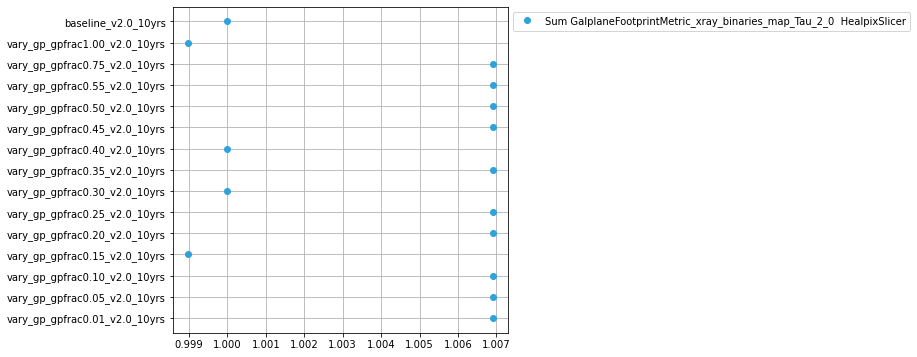

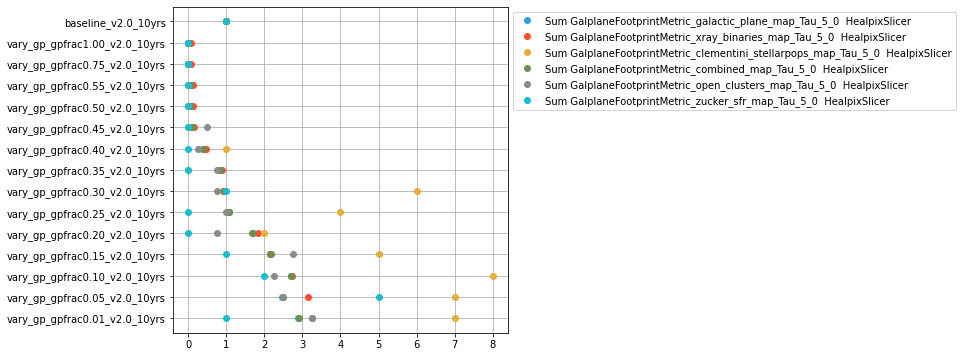

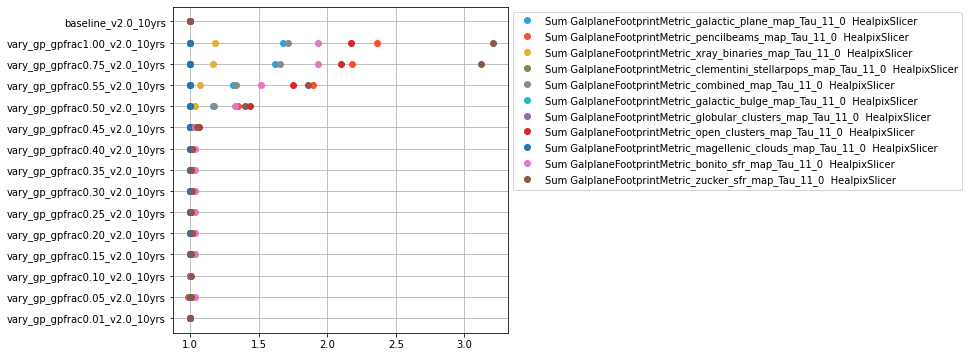

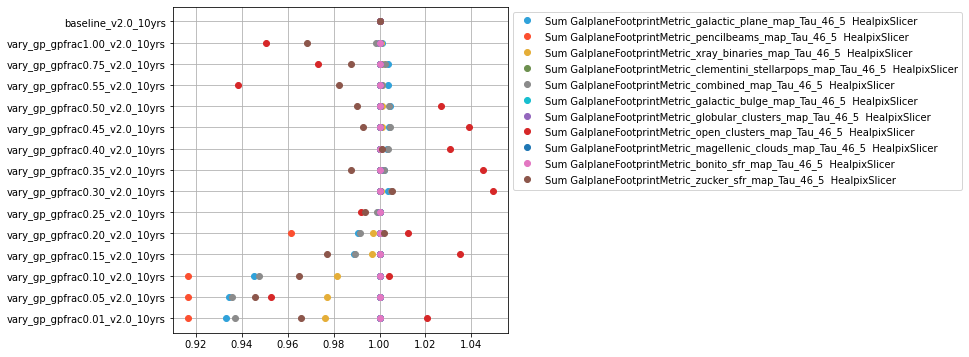

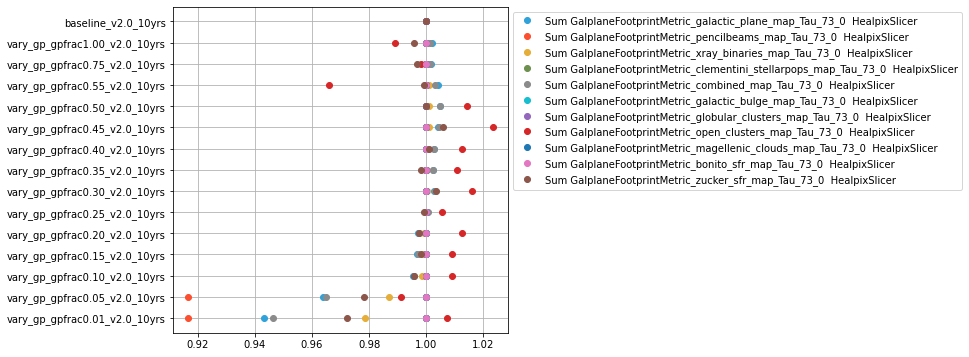

In [23]:
# Note - some of these plots show fewer than the full number of maps; this is happening because sometimes
# the *baseline* run (baseline_v2.0_10yrs) is 0 for that metric .. so the entire column become NaN
cols = [k for k in metricnames if k.startswith('footprint')]
x = np.arange(0, len(these_runs), 1)
for k in cols:
    maf.plot_run_metric(df[metricnames[k]])

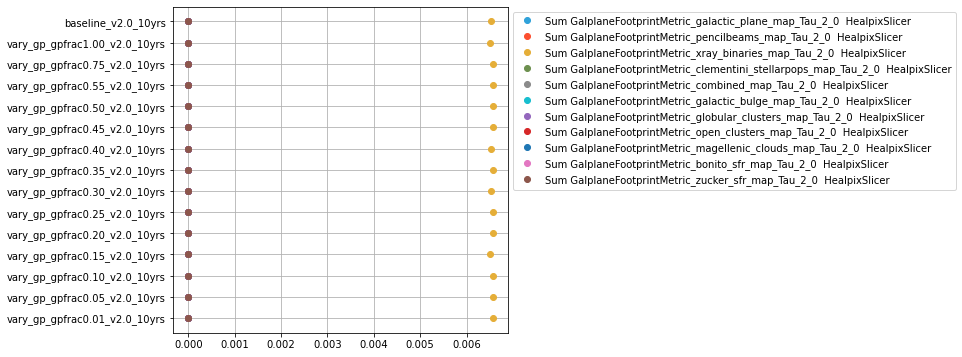

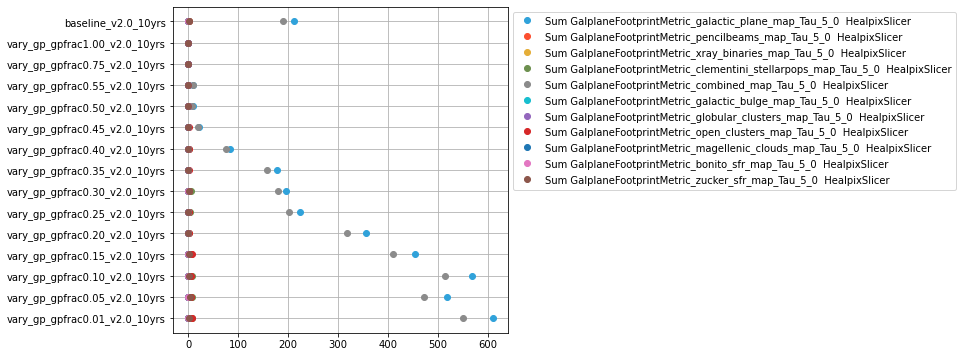

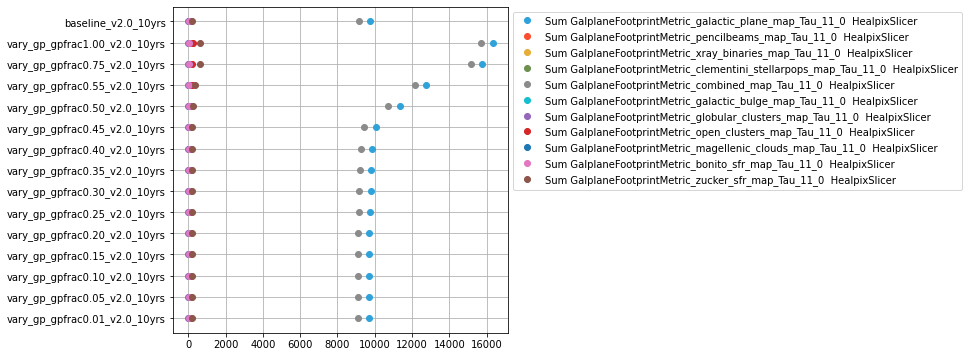

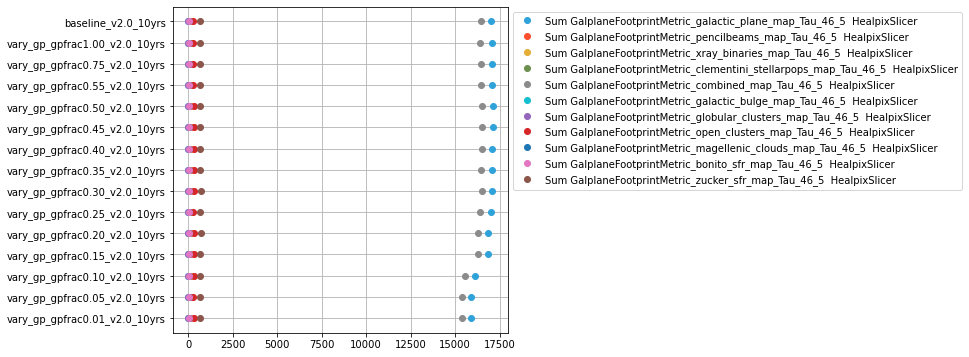

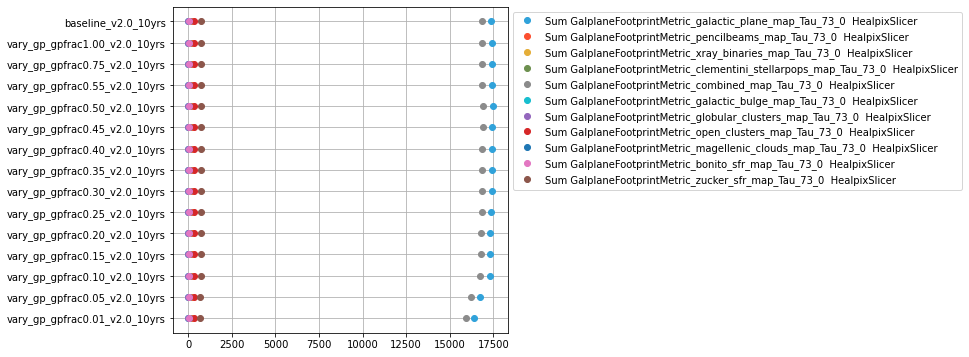

In [24]:
# Note - some of these plots show fewer than the full number of maps; this is happening because sometimes
# the *baseline* run (baseline_v2.0_10yrs) is 0 for that metric .. so the entire column become NaN
# --- see, here I plotted the non-normalized version (some maps just have much higher values)
cols = [k for k in metricnames if k.startswith('footprint')]
x = np.arange(0, len(these_runs), 1)
for k in cols:
    maf.plot_run_metric(summaries[metricnames[k]])

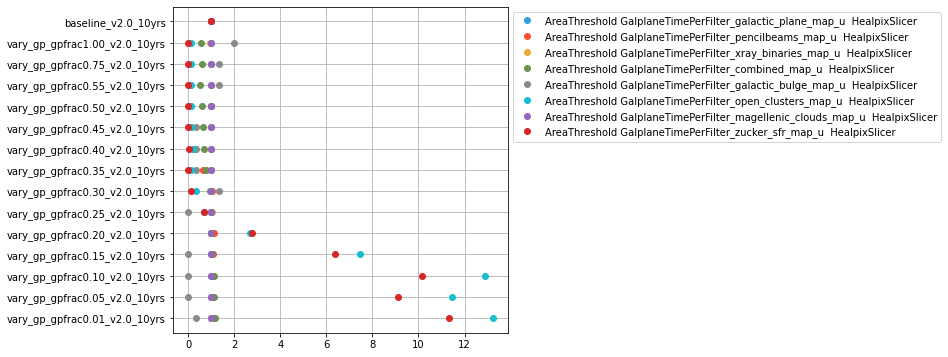

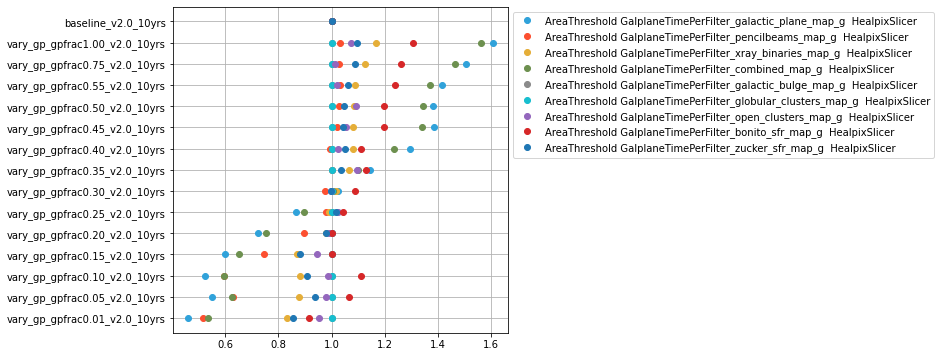

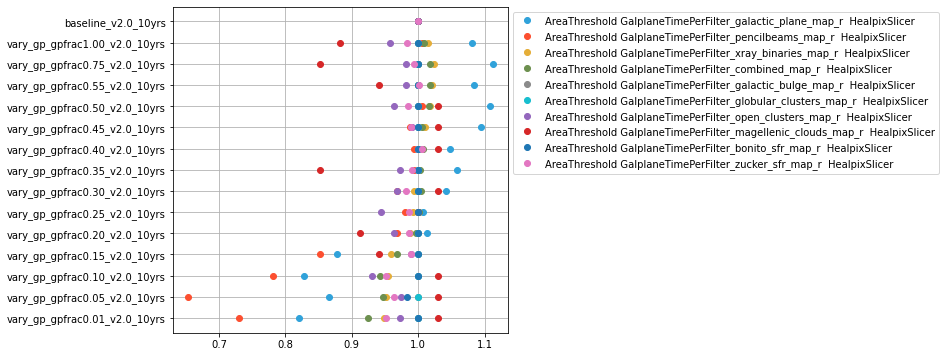

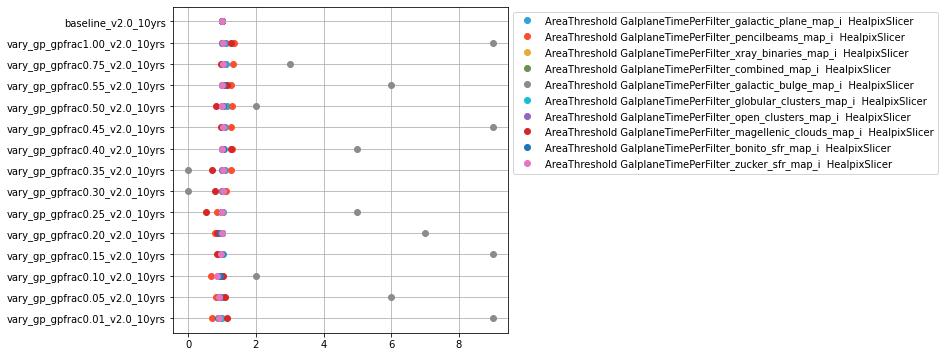

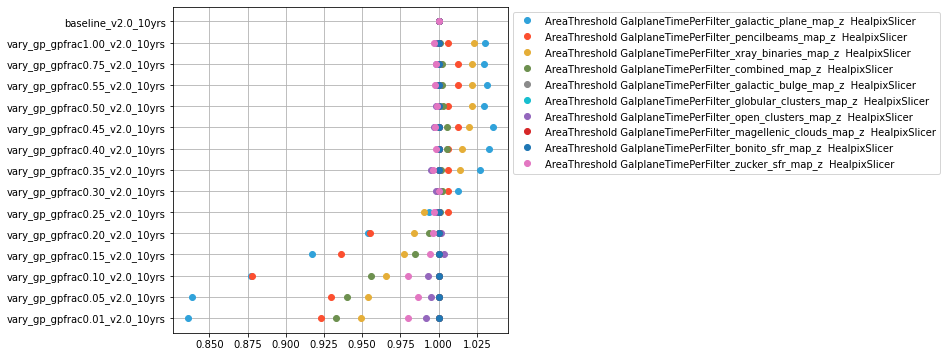

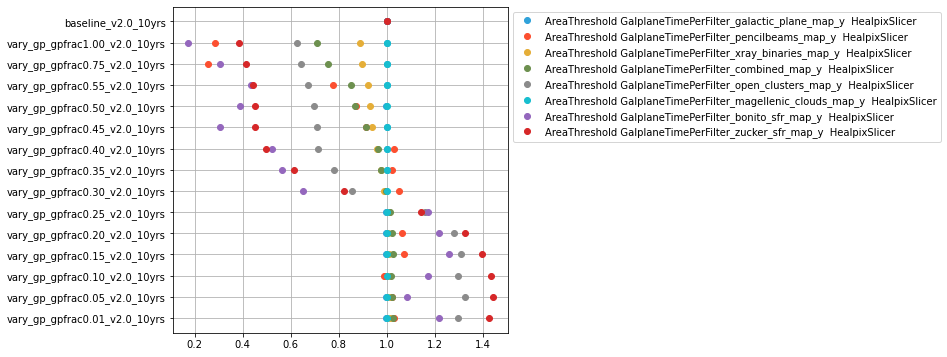

In [25]:
cols = [k for k in metricnames if k.startswith('area filter')]
x = np.arange(0, len(these_runs), 1)
for k in cols:
    maf.plot_run_metric(df[metricnames[k]])

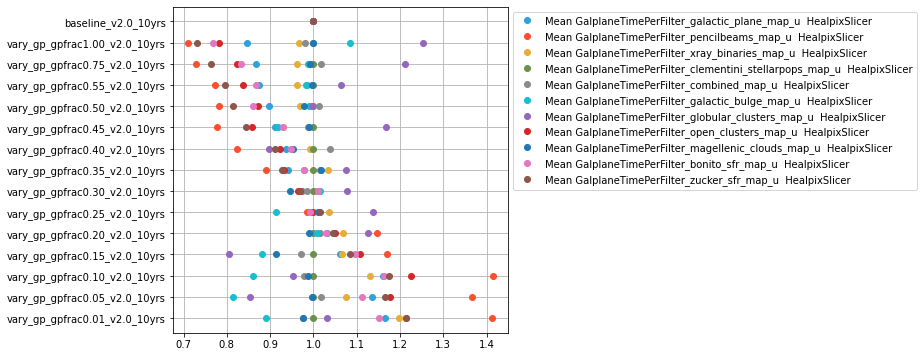

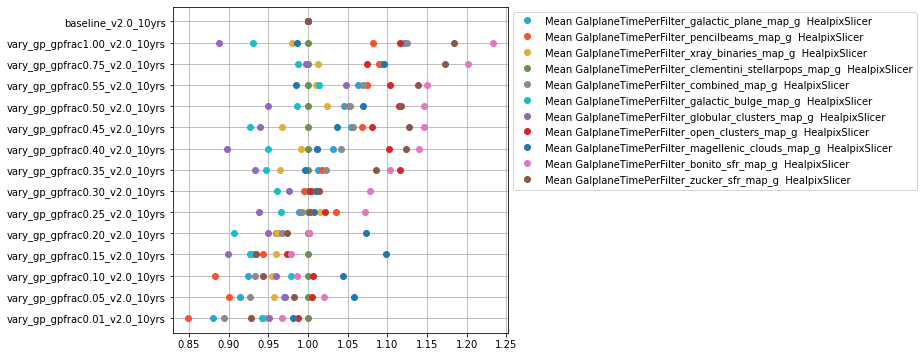

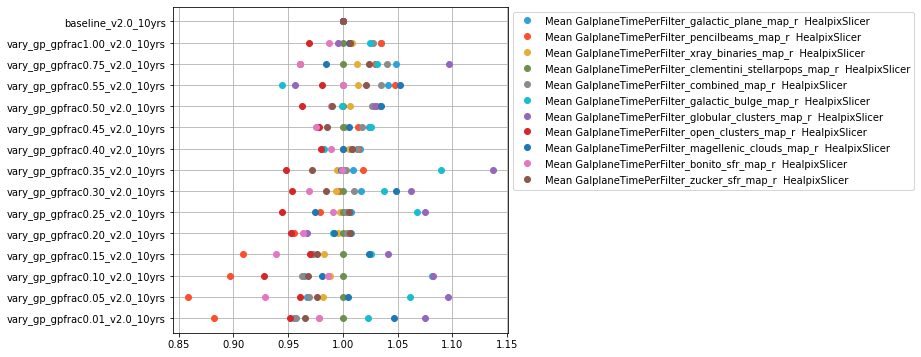

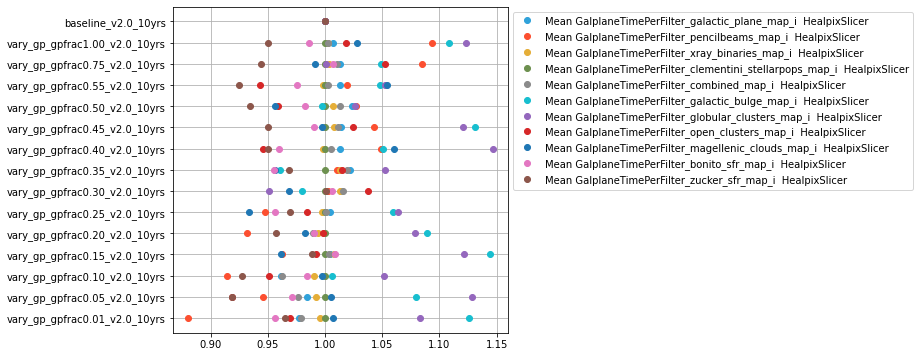

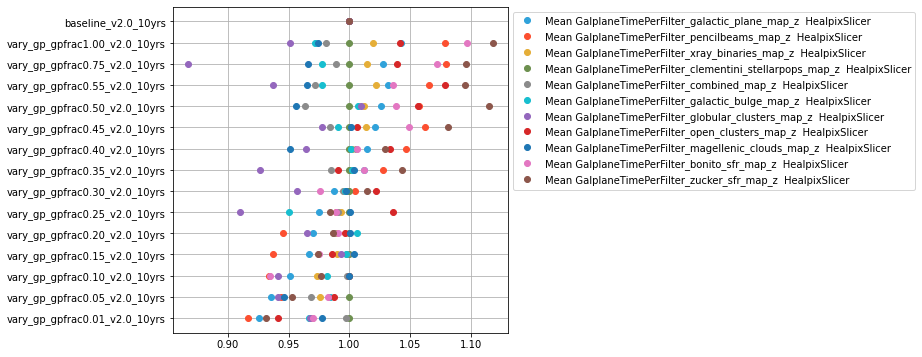

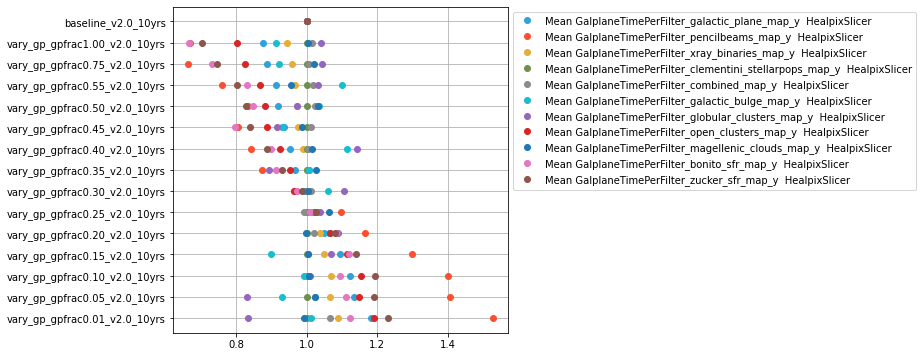

In [26]:
cols = [k for k in metricnames if k.startswith('mean filter')]
x = np.arange(0, len(these_runs), 1)
for k in cols:
    maf.plot_run_metric(df[metricnames[k]])

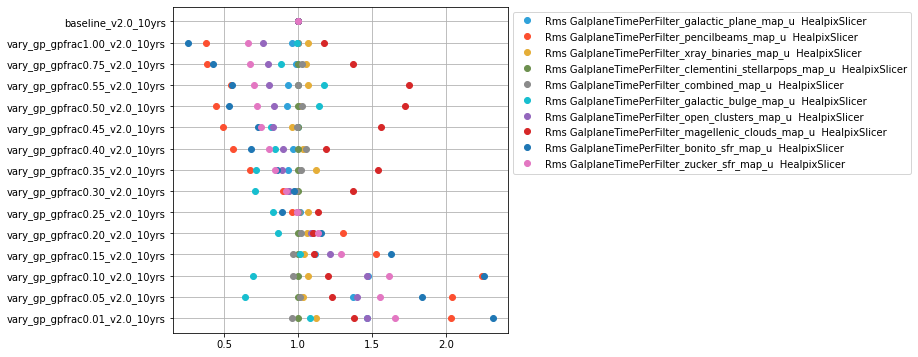

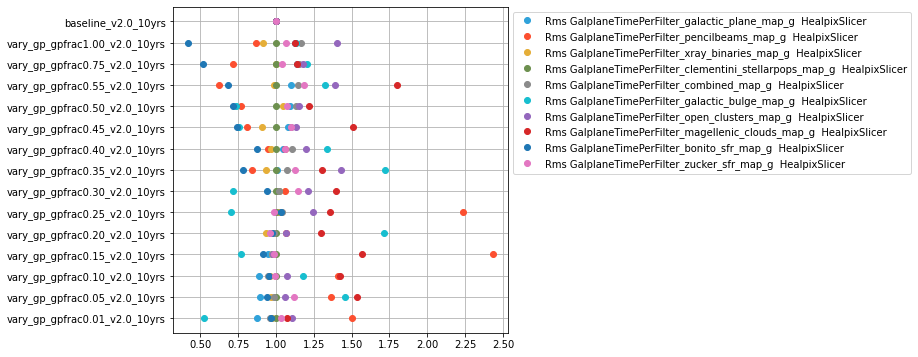

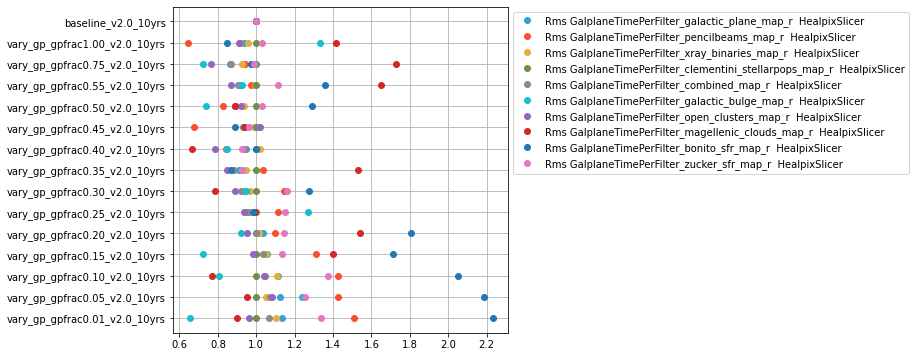

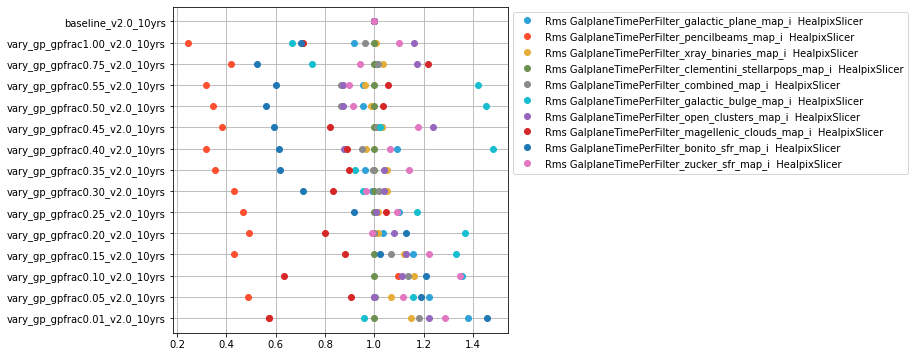

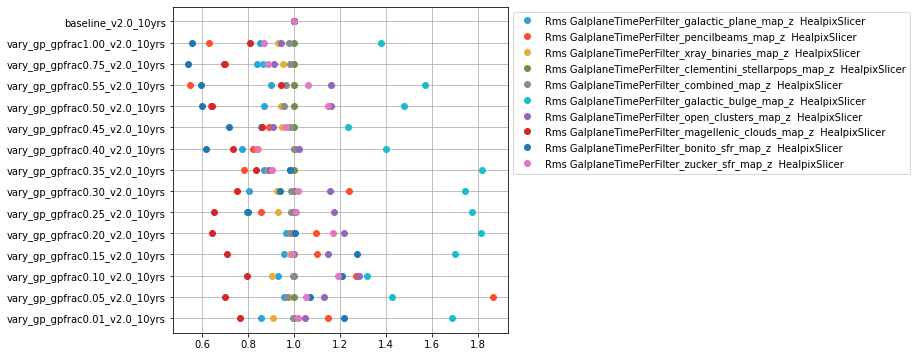

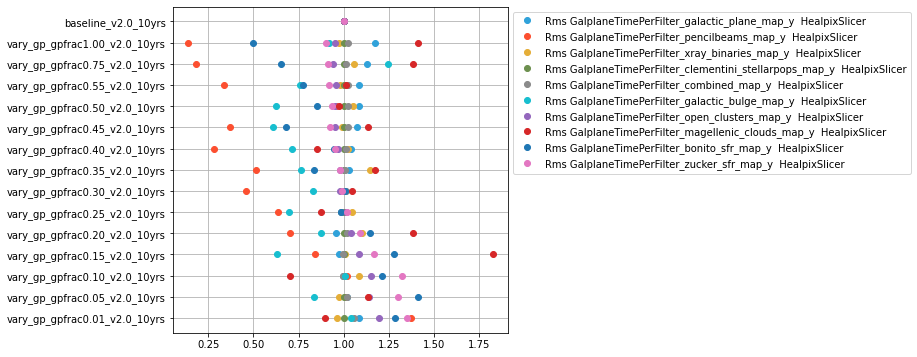

In [27]:
cols = [k for k in metricnames if k.startswith('rms filter')]
x = np.arange(0, len(these_runs), 1)
for k in cols:
    maf.plot_run_metric(df[metricnames[k]])

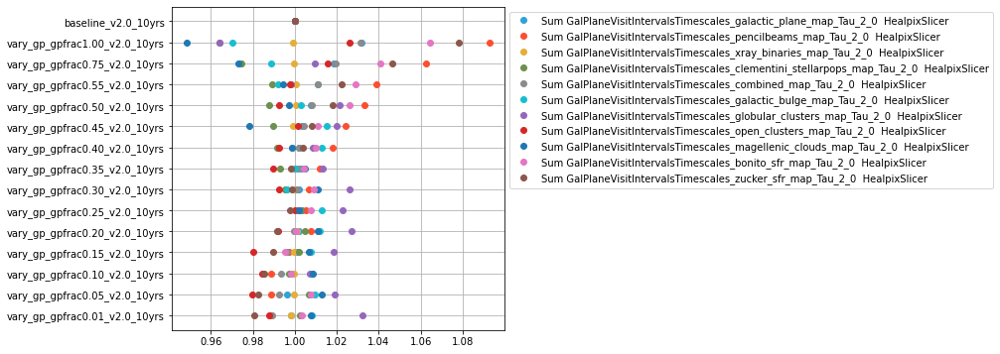

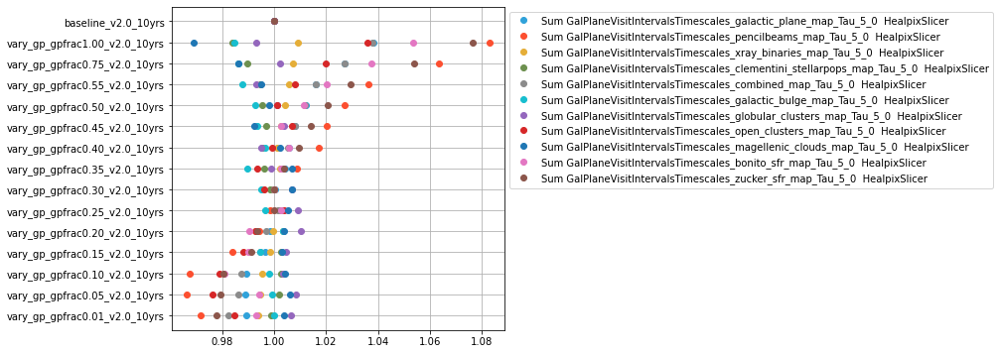

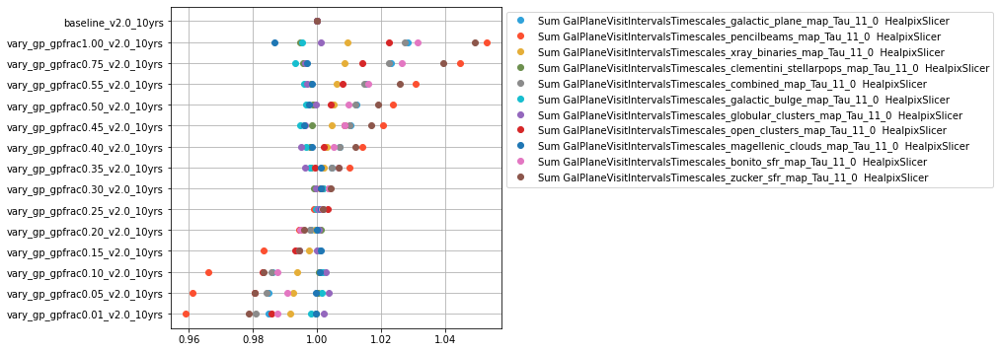

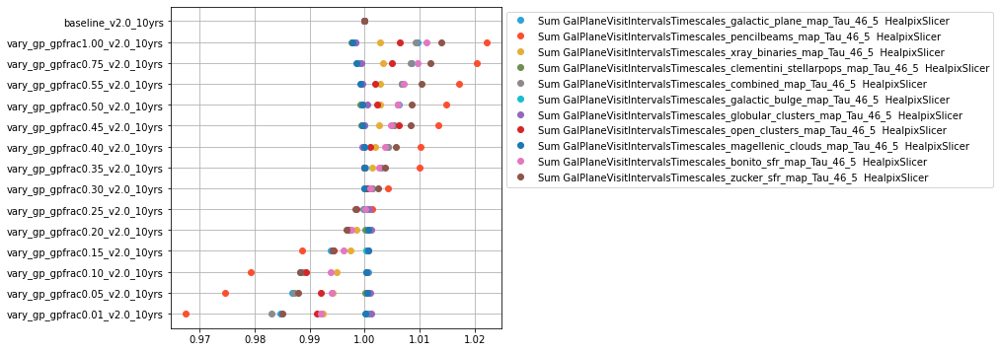

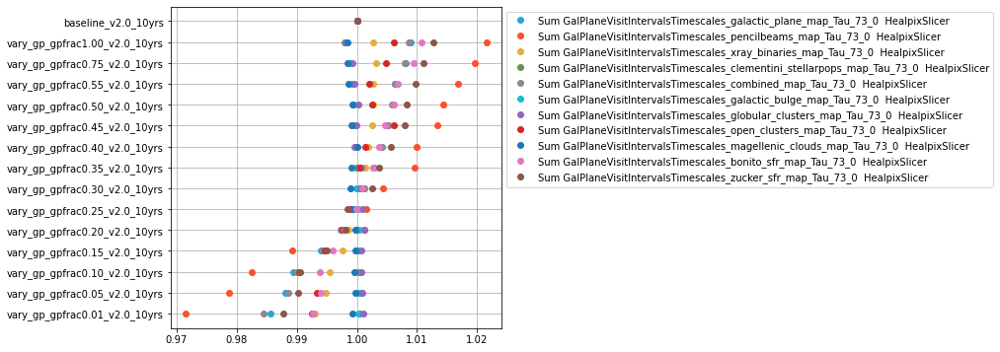

In [28]:
cols = [k for k in metricnames if k.startswith('sum visit')]
x = np.arange(0, len(these_runs), 1)
for k in cols:
    maf.plot_run_metric(df[metricnames[k]])

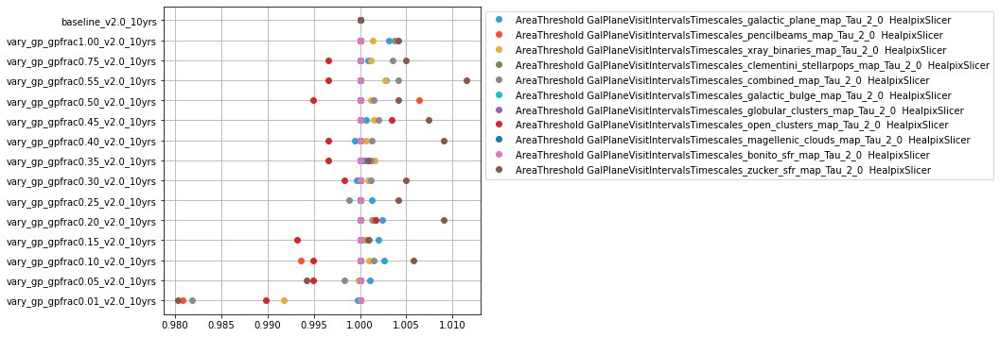

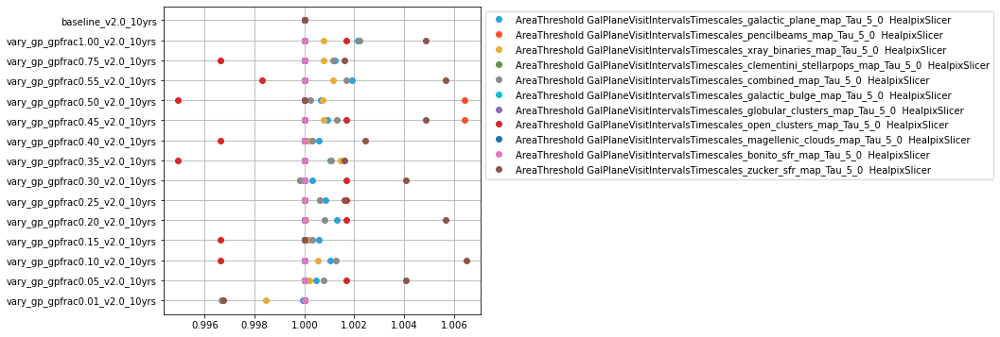

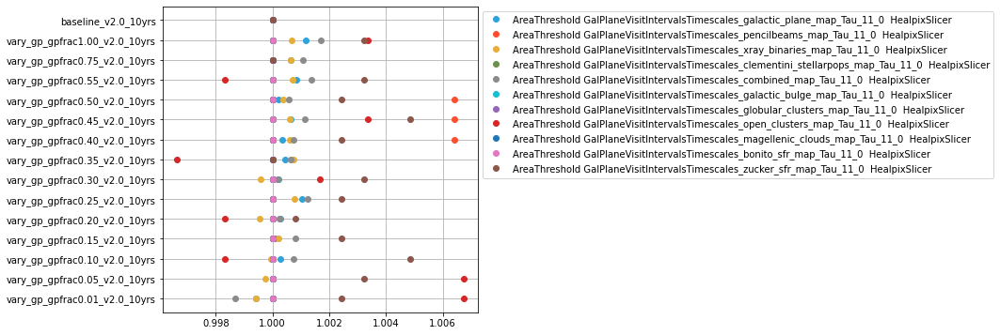

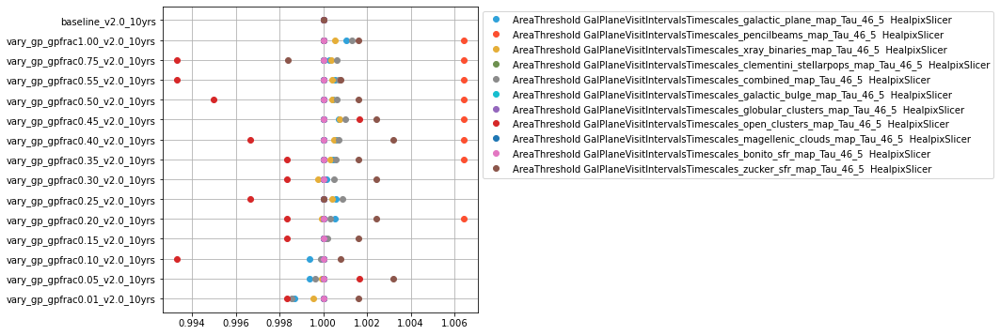

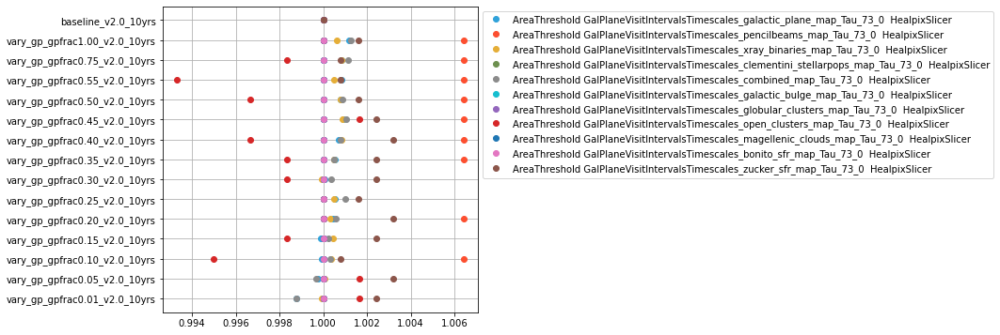

In [29]:
cols = [k for k in metricnames if k.startswith('area visit')]
x = np.arange(0, len(these_runs), 1)
for k in cols:
    maf.plot_run_metric(df[metricnames[k]])

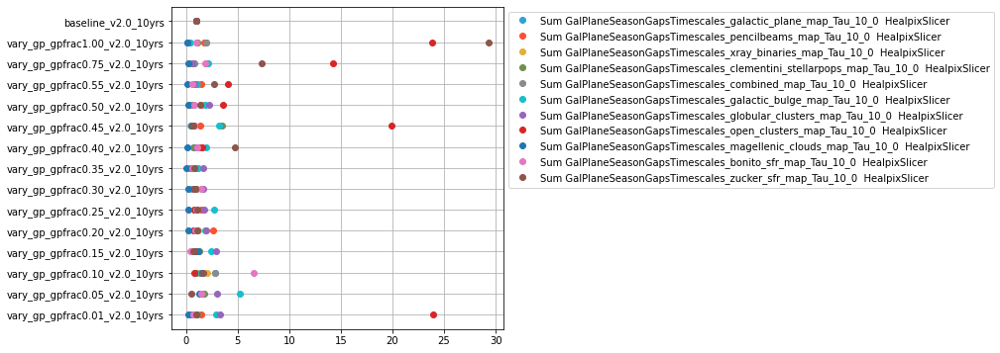

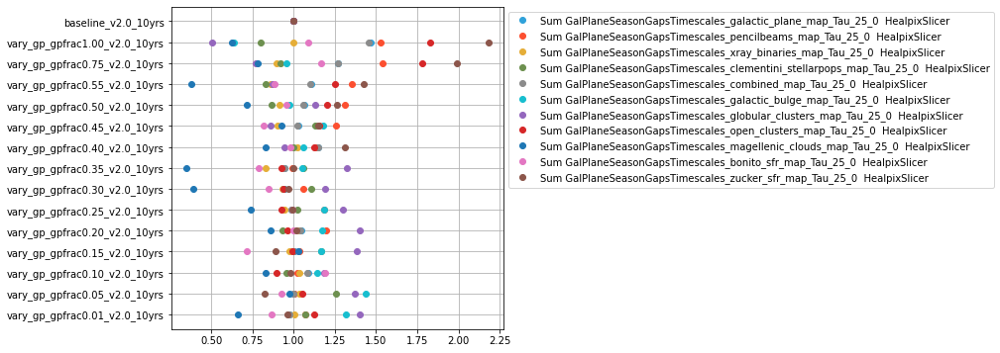

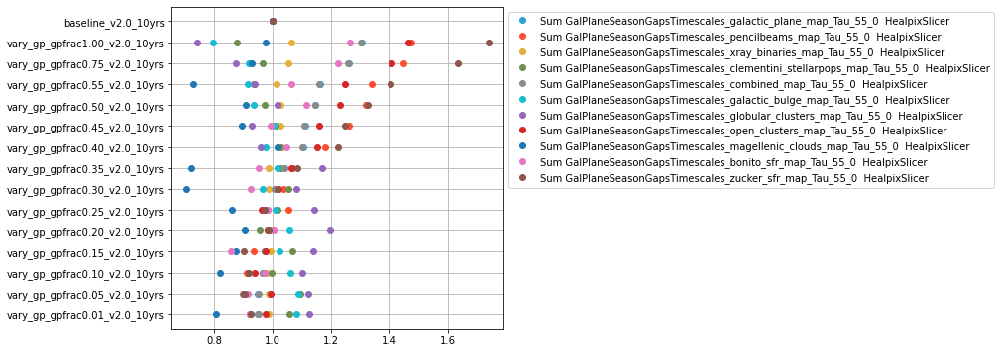

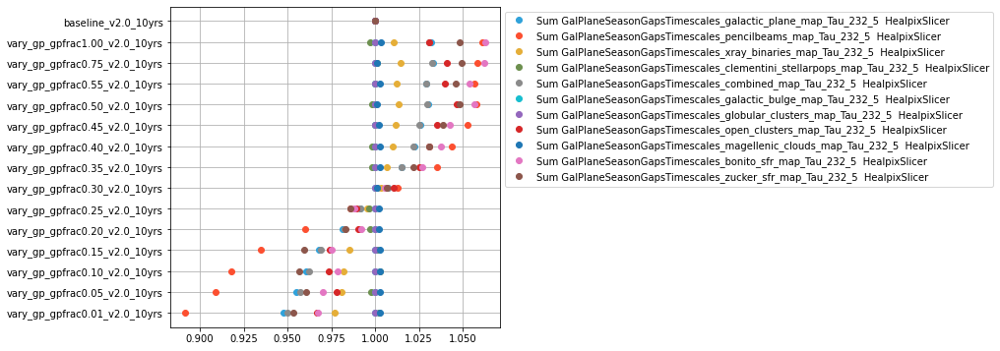

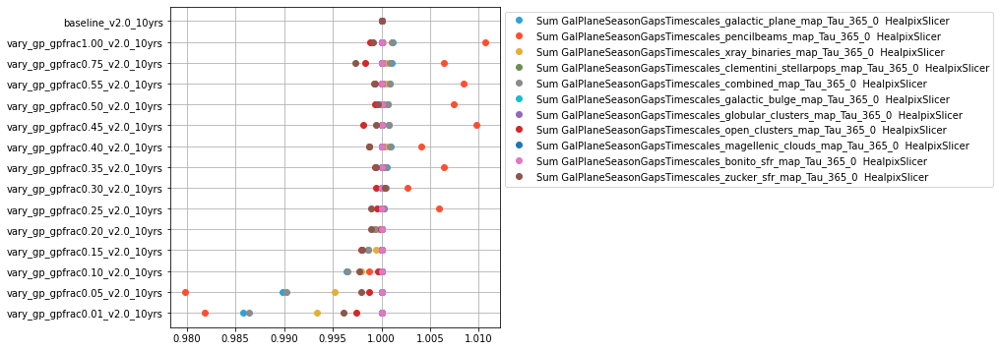

In [30]:
cols = [k for k in metricnames if k.startswith('sum season')]
x = np.arange(0, len(these_runs), 1)
for k in cols:
    maf.plot_run_metric(df[metricnames[k]])

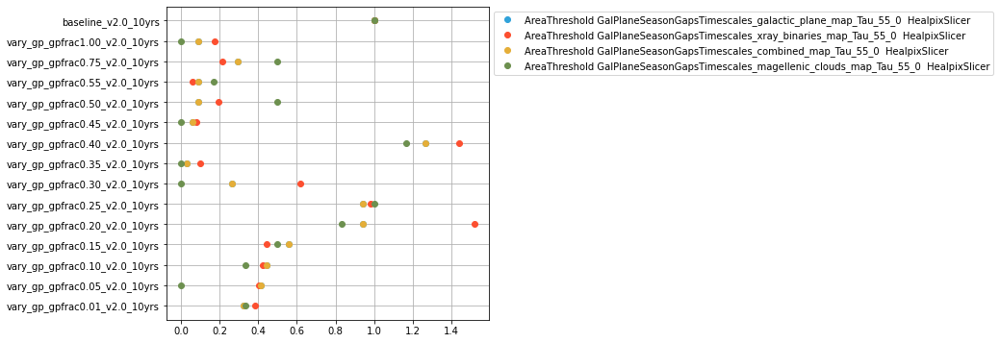

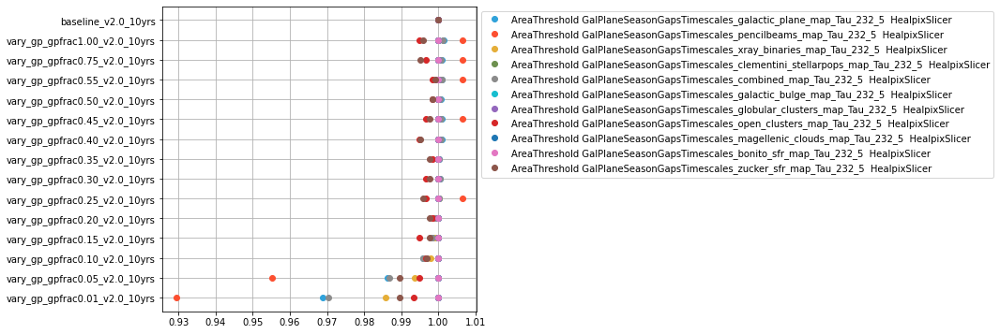

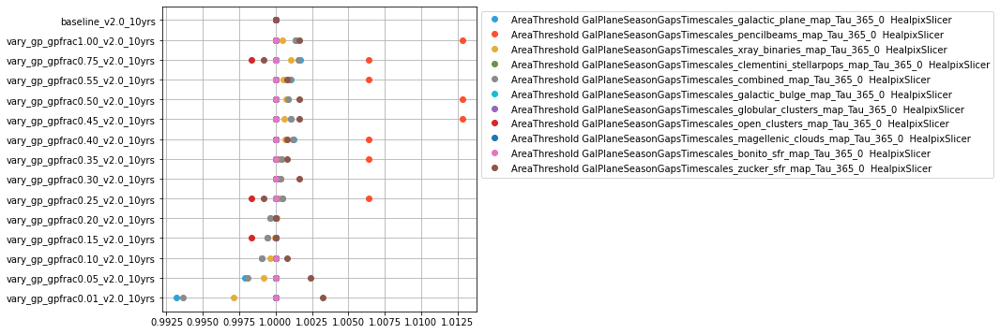

In [31]:
cols = [k for k in metricnames if k.startswith('area season')]
x = np.arange(0, len(these_runs), 1)
for k in cols[2:]:
    maf.plot_run_metric(df[metricnames[k]])

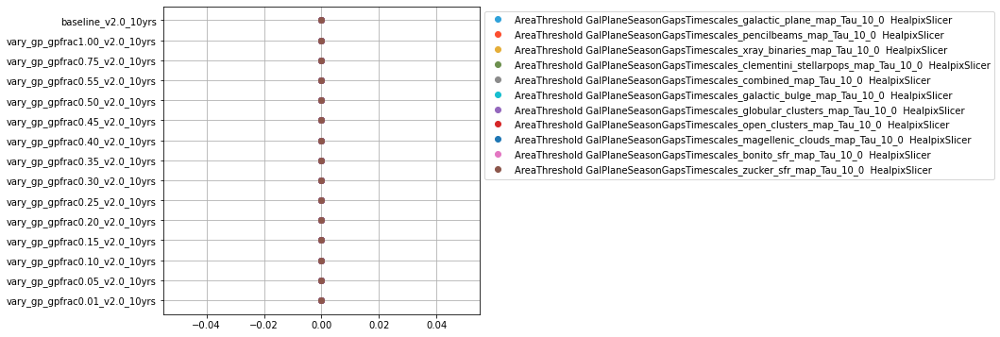

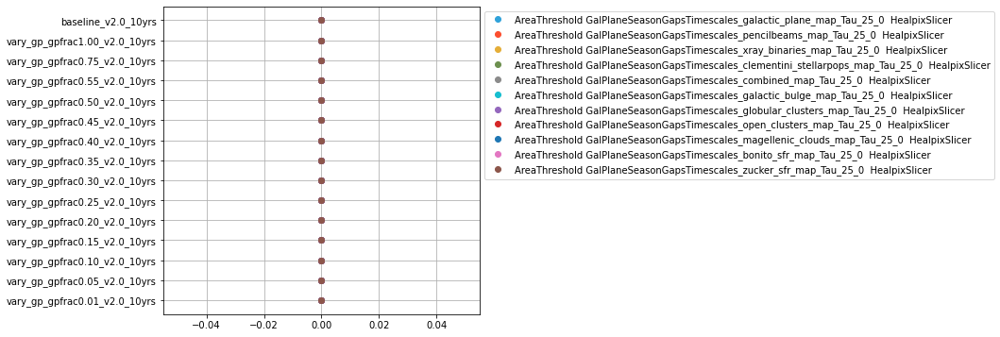

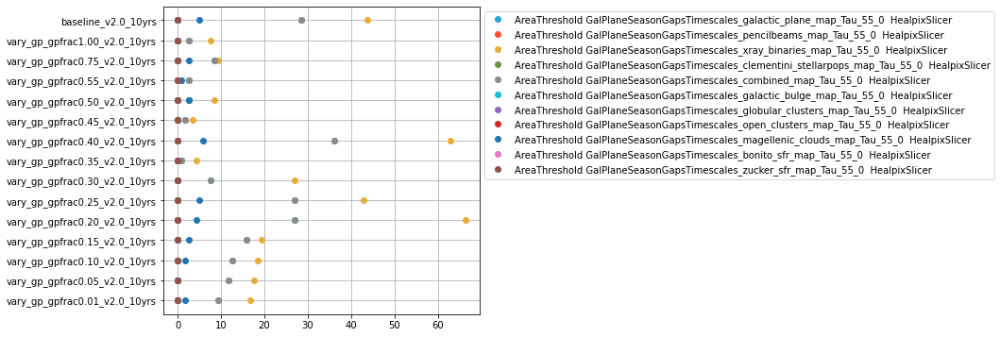

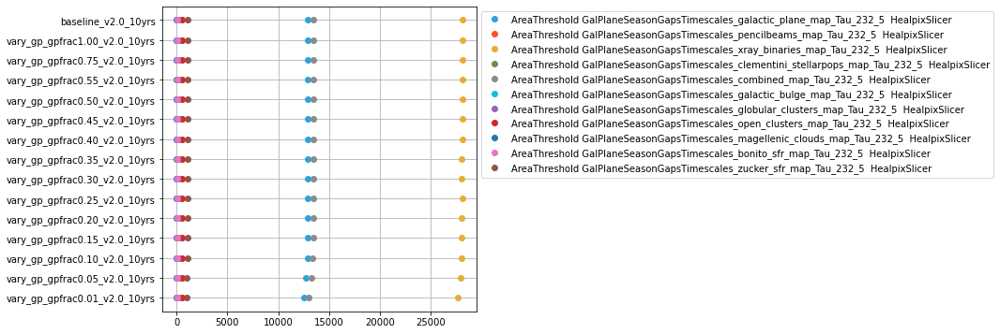

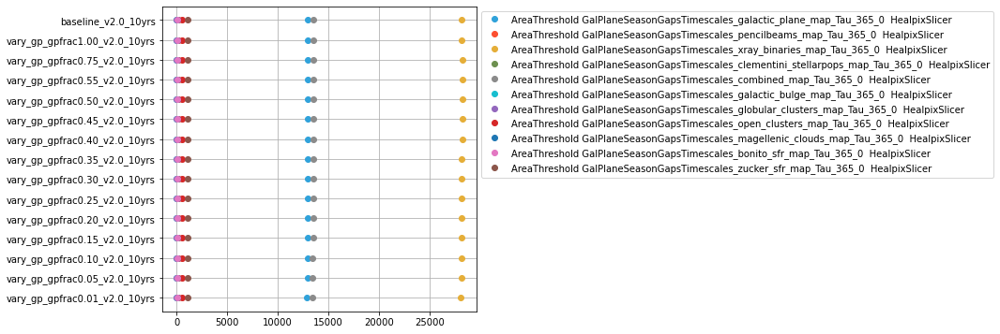

In [32]:
cols = [k for k in metricnames if k.startswith('area season')]
x = np.arange(0, len(these_runs), 1)
for k in cols:
    maf.plot_run_metric(summaries[metricnames[k]])

In [33]:
summaries.shape

(15, 748)